# ***`Direct Consumption Modeling with LIWC Inputs`***
---

#### 1. **Dataset Preparation:**
 - **Merge** liwc + consumption to one data set.
 - **train-test-split()**
 - **Target distribution and weight definition.**

#### 2. **EDA:**
 - Variance analysis to determine most discriminatory feature subset.
 - Dimensionality reduction to visualise discriminatory power of all vs. selected features.

#### 2. **Target: Smoking**
- Directly Predict Target with all features and compute feature importances.
- Predict target with tree-selected features.
- Predict target with features selected during variance analysis.
- Mutual Information
- Principle Component Analysis


#### 3. **Target Alcohol**
- Directly Predict Target with all features and compute feature importances.
- Predict target with tree-selected features.
- Predict target with features selected during variance analysis.

#### 4. **Target Drugs**
- Directly Predict Target with all features and compute feature importances.
- Predict target with tree-selected features.
- Predict target with features selected during variance analysis.

---

## Base Libraries
---

In [2]:
import pandas as pd

# import pandas_profiling as pp
#import pandas_profiling as pp

# enable to see all columns:
pd.set_option('display.max_columns', None)

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.lines as mlines

import seaborn as sns
sns.set_style('whitegrid')
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno

import shap

from typing import List, Any
from sklearn.base import BaseEstimator
from sklearn.metrics import precision_score, recall_score, f1_score

# ignore future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

PydanticImportError: `BaseSettings` has been moved to the `pydantic-settings` package. See https://docs.pydantic.dev/2.5/migration/#basesettings-has-moved-to-pydantic-settings for more details.

For further information visit https://errors.pydantic.dev/2.5/u/import-error

## Helper Functions
---

In [2]:
from helper_functions import *

## **1) Data Set Preparation**
---

### 1.1) Read Data:

In [3]:
df = pd.read_parquet("merged_data/df_cascade_consumption_liwc.parquet")
print(f"Duplicates: {df.duplicated().sum()}")
print(f"Missing values: {df.isnull().sum().sum()}")
print()
display_data_shape(df)
df.head()

Duplicates: 0
Missing values: 0

Data dimensions:
---------------------------------------------------------------------
 - Number of observations: 1,185
 - Number of columns: 97


,userid,smoking_status,alcohol_status,drug_status,WC,Analytic,Clout,Authentic,Tone,WPS,Sixltr,Dic,function.,pronoun,ppron,i,we,you,shehe,they,ipron,article,prep,auxverb,adverb,conj,negate,verb,adj,compare,interrog,number,quant,affect,posemo,negemo,anx,anger,sad,social,family,friend,female,male,cogproc,insight,cause,discrep,tentat,certain,differ,percept,see,hear,feel,bio,body,health,sexual,ingest,drives,affiliation,achieve,power,reward,risk,focuspast,focuspresent,focusfuture,relativ,motion,space,time,work,leisure,home,money,relig,death,informal,swear,netspeak,assent,nonflu,filler,AllPunc,Period,Comma,Colon,SemiC,QMark,Exclam,Dash,Quote,Apostro,Parenth,OtherP
0,ba4d96426226699b8c511ce0bee75941,True,True,True,7197,43.31,59.44,60.57,44.88,19.94,11.39,82.03,45.07,15.92,11.45,6.27,0.42,3.49,0.51,0.76,4.47,4.15,9.11,7.95,4.71,5.46,2.08,17.13,4.59,1.70,1.56,2.15,1.76,7.54,4.28,3.24,0.24,1.29,0.58,11.17,1.36,0.53,1.29,0.83,10.56,2.32,1.13,1.90,2.24,1.35,3.36,3.06,1.14,0.60,1.08,3.97,1.28,1.18,0.50,0.71,7.25,2.47,0.82,2.18,1.93,0.43,2.90,12.95,1.74,13.07,2.14,5.66,5.29,0.76,1.46,0.79,0.76,0.40,0.21,7.35,0.97,5.54,0.25,0.42,0.04,31.15,2.96,1.65,0.79,0.07,2.88,17.02,0.40,0.69,2.50,0.49,1.70
1,1a388284961e77942bae7a0ead109eea,False,True,False,4025,35.20,73.85,50.29,70.64,8.67,10.71,81.66,46.26,18.76,14.16,7.08,0.77,5.47,0.40,0.45,4.60,4.05,8.99,8.52,4.57,5.44,1.57,17.89,5.19,1.79,1.49,4.89,1.27,9.69,5.96,3.58,0.37,1.57,0.50,12.50,0.42,0.75,0.65,0.72,10.01,1.91,1.61,2.09,2.19,1.69,2.11,3.38,1.49,0.92,0.62,4.47,1.86,0.70,0.55,0.87,7.18,2.78,0.75,2.01,1.96,0.37,2.53,12.45,2.21,12.42,1.91,5.84,4.89,0.77,1.59,0.17,0.22,0.30,0.47,4.37,1.59,2.36,0.25,0.25,0.00,38.63,13.59,5.86,2.46,0.32,1.74,1.74,1.09,1.81,4.45,1.59,3.98
2,ec539b2398f80d1f395ba4cc06c230a7,False,False,False,2741,51.55,71.78,53.26,90.03,13.77,14.19,86.25,51.77,14.52,10.69,4.85,1.31,2.59,1.61,0.33,3.83,5.25,12.29,10.40,5.18,5.87,1.53,19.41,4.38,0.95,1.64,1.35,1.50,7.88,5.87,2.01,0.04,0.36,0.84,10.65,0.47,0.40,1.39,0.80,8.79,1.64,0.73,1.64,2.19,1.64,2.26,2.48,1.28,0.40,0.66,2.59,0.58,0.95,0.00,0.51,7.66,3.06,0.91,1.68,1.97,0.29,5.18,12.81,3.47,15.98,2.59,6.09,7.59,1.42,1.79,1.39,0.26,1.17,0.11,2.23,0.15,1.06,0.36,0.51,0.00,20.32,7.00,4.52,0.95,0.11,0.33,3.83,0.47,0.44,2.19,0.26,0.22
3,0e0b122ce777606ae73dd055d76fc1c7,False,False,False,5,8.19,50.00,1.00,1.00,1.67,20.00,80.00,40.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,20.00,0.00,20.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,120.00,40.00,0.00,0.00,0.00,20.00,60.00,0.00,0.00,0.00,0.00,0.00
4,58bcb86a962fc98d2feb5e3562ac45c0,True,True,False,1548,48.77,42.07,79.91,77.98,8.70,12.21,86.95,48.45,15.44,10.01,7.69,0.65,1.03,0.32,0.32,5.43,5.56,10.53,9.63,5.81,4.65,1.49,18.22,5.17,1.61,1.36,3.68,2.00,6.91,4.84,2.00,0.19,0.45,0.26,7.69,0.90,0.26,0.32,0.84,9.04,1.42,0.97,2.20,2.13,1.36,2.07,2.78,1.10,0.71,0.58,3.49,0.90,0.97,0.00,1.49,6.65,2.26,1.61,1.68,1.87,0.26,3.49,13.44,2.91,17.38,3.04,5.17,9.69,2.26,3.04,0.26,0.58,0.45,0.06,2.97,0.13,1.74,0.71,0.52,0.06,45.09,18.54,1.68,0.19,0.06,1.61,12.14,1.49,1.16,4.13,1.49,2.58


### 1.2) Filter Based on word count (WC)?

Minimum word count: 1


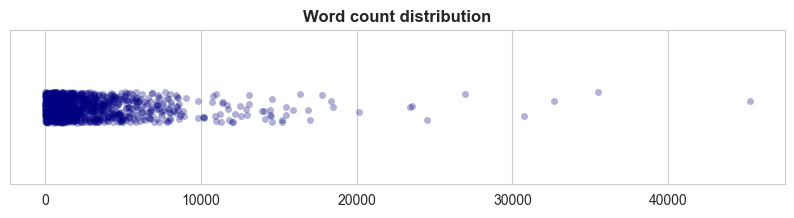

In [4]:
plt.figure(figsize=(10, 2))
plt.title('Word count distribution', weight='bold')
sns.stripplot(
        x='WC', data=df,
        jitter=True, alpha=.3,
        color='navy'
)
plt.xlabel("")
print(f"Minimum word count: {df['WC'].min()}")

In [5]:
threshold = int(input("Enter the minimum word count: ")) # 50
df = df.query('WC >= @threshold')
display_data_shape(df)

Data dimensions:
---------------------------------------------------------------------
 - Number of observations: 1,185
 - Number of columns: 97


### 1.3) Train-Test-Split
- define feature and predictor sets:

In [6]:
consumption = [c for c in df.columns if c.endswith('status')]
liwc        = [
        c for c in df.columns
            if c not in consumption
            and c != 'userid'
    ]

print(f"# features in liwc: {len(liwc)}")
print(f"Targets: {consumption}")

# features in liwc: 93
Targets: ['smoking_status', 'alcohol_status', 'drug_status']


- train-test-split():

In [8]:
from sklearn.model_selection import train_test_split
X = df[liwc]
y_smoking, y_alcohol, y_drugs = df['smoking_status'].astype(int), df['alcohol_status'].astype(int), df['drug_status'].astype(int)

# split data for each of the three targets into train and test sets:

'Smoking'
X_train_smoke, X_test_smoke, \
    y_train_smoke, y_test_smoke = train_test_split(
                                            X, y_smoking, test_size=0.2, stratify=y_smoking, random_state=42
    )

'Alchohol'
X_train_alc, X_test_alc, \
    y_train_alc, y_test_alc = train_test_split(
                                            X, y_alcohol, test_size=0.2, stratify=y_alcohol, random_state=42
    )

'Drugs'
X_train_drug, X_test_drug, \
    y_train_drug, y_test_drug = train_test_split(
                                            X, y_drugs, test_size=0.2, stratify=y_drugs, random_state=42
    )

### 1.4) Target Distributions & Weight Definition

In [9]:
plot_target_ratios(
    df      = df,
    targets = consumption,
)

In [10]:
# select label frequencies
class_0_smoke, class_1_smoke = y_train_smoke.value_counts()[0], y_train_smoke.value_counts()[1]
class_0_alc, class_1_alc     = y_train_alc.value_counts()[0], y_train_alc.value_counts()[1]
class_0_drug, class_1_drug   = y_train_drug.value_counts()[0], y_train_drug.value_counts()[1]

# compute class weights for each target:
# -> formula = n negative samples / n positive samples
weight_smoke = round(class_0_smoke / class_1_smoke, 2)
weight_alc   = round(class_0_alc / class_1_alc, 2)
weight_drugs = round(class_0_drug / class_1_drug, 2)

# display as dataframe
pd.DataFrame(
        data    = [[weight_smoke, weight_alc, weight_drugs]],
        columns = ['smoking_status', 'alcohol_status', 'drug_status'],
        index   = ['weights']
).transpose()

,weights
smoking_status,2.98
alcohol_status,1.07
drug_status,4.42


## **2) EDA & Feature Selection**
---
### 2.1) Variance Analysis
> `Select desired target variable and plot corresponding liwc feature distributions:`

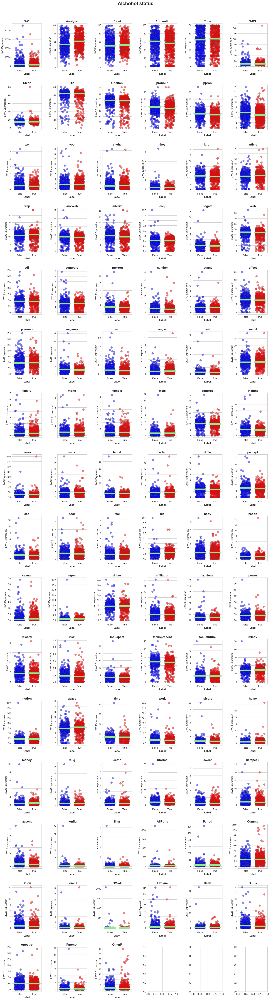

In [11]:
plot_continuous_features_target(
    df       = df,
    features = liwc,
    target   = 'alcohol_status',
    title    = 'Alchohol status',
)

### 2.2) Mann-Whitney U with Benjamini Hochberg Correction:

In [11]:
print("Smoking:")
smoking_features_df = mannwhitney_adjusted(
    data     = df,
    features = liwc,
    target   = 'smoking_status',
    alpha    = 0.05
)
smoking_anova_features = smoking_features_df['feature'].tolist()
print(smoking_anova_features)
display(smoking_features_df.T)


print("\nDrugs:")
drugs_features_df = mannwhitney_adjusted(
    data     = df,
    features = liwc,
    target   = 'drug_status',
    alpha    = 0.05
)
drug_anova_features = drugs_features_df['feature'].tolist()
print(drug_anova_features)
display(drugs_features_df.T)


print("\nAlchohol:")
alcohol_features_df = mannwhitney_adjusted(
    data     = df,
    features = liwc,
    target   = 'alcohol_status',
    alpha    = 0.05
)
alcohol_anova_features = alcohol_features_df['feature'].tolist()
print(alcohol_anova_features)
display(alcohol_features_df.T)

Smoking:
22 out of 93 features are significant with respect to smoking_status after p-value adjustment:
['bio', 'swear', 'work', 'sexual', 'Colon', 'number', 'see', 'focuspast', 'assent', 'percept', 'health', 'time', 'adverb', 'social', 'body', 'nonflu', 'leisure', 'you', 'Sixltr', 'anx', 'anger', 'certain']


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
feature,bio,swear,work,sexual,Colon,number,see,focuspast,assent,percept,health,time,adverb,social,body,nonflu,leisure,you,Sixltr,anx,anger,certain
adjusted_p_value,0.0,0.0,0.0,0.0,0.0,0.0002,0.0009,0.0009,0.0028,0.0028,0.0028,0.0048,0.0095,0.0096,0.0107,0.0137,0.0152,0.0173,0.0173,0.0173,0.0188,0.0227



Drugs:
23 out of 93 features are significant with respect to drug_status after p-value adjustment:
['body', 'swear', 'anger', 'bio', 'sexual', 'discrep', 'filler', 'ingest', 'work', 'number', 'negemo', 'money', 'health', 'informal', 'you', 'ppron', 'Tone', 'pronoun', 'Colon', 'focuspresent', 'certain', 'i', 'time']


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
feature,body,swear,anger,bio,sexual,discrep,filler,ingest,work,number,negemo,money,health,informal,you,ppron,Tone,pronoun,Colon,focuspresent,certain,i,time
adjusted_p_value,0.0,0.0,0.0,0.0,0.0,0.0016,0.0016,0.0016,0.0016,0.003,0.0067,0.008,0.008,0.0092,0.0124,0.0171,0.0194,0.0212,0.0212,0.0227,0.0336,0.0336,0.0464



Alchohol:
46 out of 93 features are significant with respect to alcohol_status after p-value adjustment:
['Analytic', 'i', 'number', 'adverb', 'Colon', 'assent', 'money', 'ppron', 'space', 'pronoun', 'OtherP', 'sexual', 'prep', 'bio', 'focuspast', 'anx', 'swear', 'differ', 'hear', 'insight', 'ingest', 'nonflu', 'negate', 'Authentic', 'cause', 'AllPunc', 'risk', 'auxverb', 'work', 'interrog', 'verb', 'percept', 'negemo', 'cogproc', 'Quote', 'see', 'article', 'death', 'they', 'Clout', 'we', 'sad', 'Sixltr', 'netspeak', 'shehe', 'ipron']


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45
feature,Analytic,i,number,adverb,Colon,assent,money,ppron,space,pronoun,OtherP,sexual,prep,bio,focuspast,anx,swear,differ,hear,insight,ingest,nonflu,negate,Authentic,cause,AllPunc,risk,auxverb,work,interrog,verb,percept,negemo,cogproc,Quote,see,article,death,they,Clout,we,sad,Sixltr,netspeak,shehe,ipron
adjusted_p_value,0.0,0.0,0.0,0.0,0.0001,0.0001,0.0001,0.0001,0.0001,0.0002,0.0004,0.0006,0.0008,0.0008,0.001,0.0011,0.0011,0.0012,0.0025,0.0025,0.0027,0.0043,0.0044,0.0051,0.0056,0.0056,0.0064,0.0069,0.0075,0.0076,0.0086,0.0093,0.0094,0.01,0.0103,0.013,0.013,0.0173,0.0176,0.0176,0.0212,0.0212,0.0217,0.0229,0.0275,0.0332


### 2.3) Mutual Information Gain:

In [12]:
from sklearn.feature_selection import mutual_info_classif

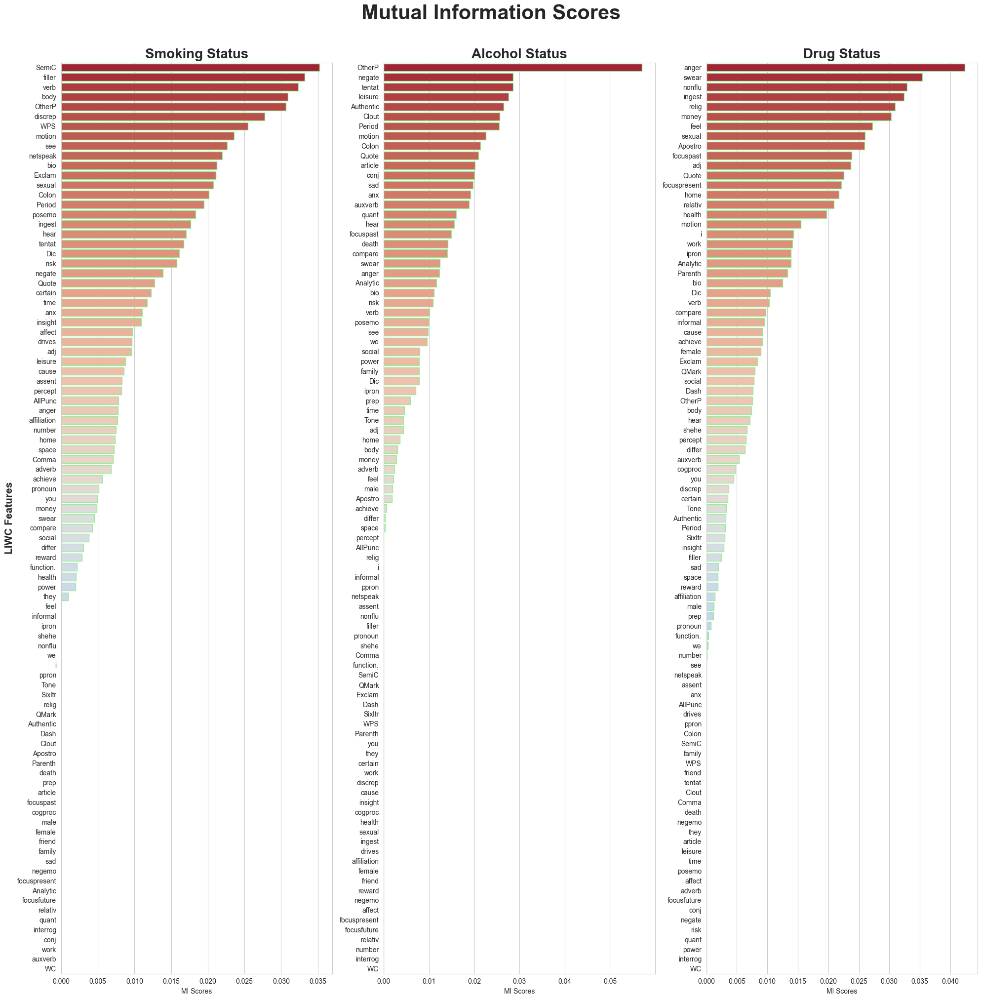

In [13]:
mi_scores_smoke = mutual_info_classif(X_train_smoke, y_train_smoke, random_state=42)
mi_scores_smoke = pd.Series(mi_scores_smoke, name="MI Scores", index=X_train_smoke.columns)
mi_scores_smoke = mi_scores_smoke.sort_values(ascending=False)

mi_scores_alc = mutual_info_classif(X_train_alc, y_train_alc, random_state=42)
mi_scores_alc = pd.Series(mi_scores_alc, name="MI Scores", index=X_train_alc.columns)
mi_scores_alc = mi_scores_alc.sort_values(ascending=False)

mi_scores_drug = mutual_info_classif(X_train_drug, y_train_drug, random_state=42)
mi_scores_drug = pd.Series(mi_scores_drug, name="MI Scores", index=X_train_drug.columns)
mi_scores_drug = mi_scores_drug.sort_values(ascending=False)

fig, ax = plt.subplots(1, 3, figsize=(20, 20))
fig.suptitle('Mutual Information Scores', weight='bold', size=30).set_y(1.01)

sns.barplot(x=mi_scores_smoke, y=mi_scores_smoke.index, palette='coolwarm_r', edgecolor='lightgreen', ax=ax[0])
ax[0].set_title('Smoking Status', weight='bold', size=20)
ax[0].set_ylabel('LIWC Features', size=15, weight='bold')

sns.barplot(x=mi_scores_alc, y=mi_scores_alc.index, palette='coolwarm_r', edgecolor='lightgreen', ax=ax[1])
ax[1].set_title('Alcohol Status', weight='bold', size=20)
ax[1].set_ylabel('')

sns.barplot(x=mi_scores_drug, y=mi_scores_drug.index, palette='coolwarm_r', edgecolor='lightgreen', ax=ax[2])
ax[2].set_title('Drug Status', weight='bold', size=20)
ax[2].set_ylabel('')

fig.tight_layout();

In [14]:
# select top n features for each target
top_n = int(input("Enter the number of features to select: "))
print(f"Mutual Information Top {top_n} Features:\n{999*'-'}")

smoking_mi_features = mi_scores_smoke[:top_n].index.tolist()
alcohol_mi_features = mi_scores_alc[:top_n].index.tolist()
drugs_mi_features   = mi_scores_drug[:top_n].index.tolist()

print(f"Smoking: {smoking_mi_features}")
print(f"Alcohol: {alcohol_mi_features}")
print(f"Drugs: {drugs_mi_features}")

Mutual Information Top 22 Features:
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### 2.3) Dimensionality Reduction:

In [20]:
import pacmap
from sklearn.preprocessing import StandardScaler
from plotly.subplots import make_subplots

In [21]:
from sklearn.preprocessing import StandardScaler
import pacmap

def scale_and_pacmap_transform(X):
    """ Scale and transform the data using PaCMAP
    """
    # Scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # PaCMAP 3D
    pm_3d = pacmap.PaCMAP(n_components=3, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)
    embeddings_3d = pm_3d.fit_transform(X_scaled)

    return embeddings_3d

# Applying the function to your datasets
embeddings_3d_smoke = scale_and_pacmap_transform(X_train_smoke)
embeddings_3d_alc   = scale_and_pacmap_transform(X_train_alc)
embeddings_3d_drug  = scale_and_pacmap_transform(X_train_drug)

embedding_3d_smoke_anova = scale_and_pacmap_transform(df1[smoking_anova_features])
embedding_3d_alc_anova   = scale_and_pacmap_transform(df1[alcohol_anova_features])
embedding_3d_drug_anova  = scale_and_pacmap_transform(df1[drug_anova_features])

embedding_3d_smoke_mi = scale_and_pacmap_transform(df1[smoking_mi_features])
embedding_3d_alc_mi   = scale_and_pacmap_transform(df1[alcohol_mi_features])
embedding_3d_drug_mi  = scale_and_pacmap_transform(df1[drugs_mi_features])

In [22]:
def plot_3d_embeddings(embeddings_3d, y):
    trace = go.Scatter3d(
        x=embeddings_3d[:, 0], y=embeddings_3d[:, 1], z=embeddings_3d[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            opacity=0.8,
            color= ['blue' if val == False else 'red' for val in y],
        )
    )
    return trace

# Define the layout of your grid
rows = 3  # Number of rows
cols = 3  # Number of columns

# Create a subplot figure
fig = make_subplots(
    rows=rows, cols=cols,
    specs=[[{'type': 'scatter3d'} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=[
        'Smoking Data', 'Alcohol Data', 'Drug Data',
        'Smoking Data (ANOVA Features)', 'Alcohol Data (ANOVA Features)', 'Drug Data (ANOVA Features)',
        'Smoking Data (MI Features)', 'Alcohol Data (MI Features)', 'Drug Data (MI Features)'
    ]
)

# Add traces to the subplot figure
fig.add_trace(plot_3d_embeddings(embeddings_3d_smoke, y_train_smoke), row=1, col=1)
fig.add_trace(plot_3d_embeddings(embeddings_3d_alc, y_train_alc), row=1, col=2)
fig.add_trace(plot_3d_embeddings(embeddings_3d_drug, y_train_drug), row=1, col=3)

fig.add_trace(plot_3d_embeddings(embedding_3d_smoke_anova, y_train_smoke), row=2, col=1)
fig.add_trace(plot_3d_embeddings(embedding_3d_alc_anova, y_train_alc), row=2, col=2)
fig.add_trace(plot_3d_embeddings(embedding_3d_drug_anova, y_train_drug), row=2, col=3)

fig.add_trace(plot_3d_embeddings(embedding_3d_smoke_mi, y_train_smoke), row=3, col=1)
fig.add_trace(plot_3d_embeddings(embedding_3d_alc_mi, y_train_alc), row=3, col=2)
fig.add_trace(plot_3d_embeddings(embedding_3d_drug_mi, y_train_drug), row=3, col=3)

# Update layout
fig.update_layout(height=900, width=1200, title_text="3D Embeddings Comparison")

# Show the figure
fig.show()

## **3) Target Smoking**
---

> `>>> Trying to predict smoking turns out to be troublesome, so far! <<<`

### 3.1) XGBoost

#### 3.1.1) XGBoost Baseline with all features:

In [15]:
from xgboost import XGBClassifier
import optuna
from sklearn.metrics import make_scorer, f1_score, balanced_accuracy_score
from sklearn.model_selection import StratifiedKFold, cross_val_score

- Optimization:

In [57]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 99)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-2, 10.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_smoke,
                    eval_metric      = 'logloss',
                    random_state     = 42,
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_smoke,
                        y         = y_train_smoke,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-29 14:36:02,175] A new study created in memory with name: no-name-558ff11b-0eea-4b39-84ab-3415d5c1e379
[I 2023-12-29 14:36:02,568] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 61, 'max_depth': 8, 'min_child_weight': 1, 'subsample': 0.0018788083873079232, 'colsample_bytree': 0.10442867910468948, 'learning_rate': 0.0417953024829516, 'reg_alpha': 0.03835331968884116}. Best is trial 0 with value: 0.5.
[I 2023-12-29 14:36:03,043] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 54, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.25536341379344546, 'colsample_bytree': 0.08068609981281549, 'learning_rate': 0.001821514544341415, 'reg_alpha': 0.20946498046700632}. Best is trial 0 with value: 0.5.
[I 2023-12-29 14:36:03,563] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 40, 'max_depth': 9, 'min_child_weight': 1, 'subsample': 0.10320242824401725, 'colsample_bytree': 0.4762485109331801, 'learning_rate': 0.001185615104636767

___________________________________________________________________________________________________
Best trial: {'n_estimators': 99, 'max_depth': 2, 'min_child_weight': 8, 'subsample': 0.40376189537681656, 'colsample_bytree': 0.36160530700404236, 'learning_rate': 0.06226928683201542, 'reg_alpha': 4.516726583685263}


- Refit model with best parameters:
   - Best trial:

In [58]:
best_params = study.best_trial.params

# initialize XGBoost model with best parameters
model = XGBClassifier(
                n_estimators     = best_params['n_estimators'],
                max_depth        = best_params['max_depth'],
                min_child_weight = best_params['min_child_weight'],
                subsample        = best_params['subsample'],
                colsample_bytree = best_params['colsample_bytree'],
                learning_rate    = best_params['learning_rate'],
                reg_alpha        = best_params['reg_alpha'],
                scale_pos_weight = weight_smoke,
                eval_metric      = 'logloss',
                random_state     = 42
)

# fit model on training data
model.fit(X_train_smoke, y_train_smoke)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.36160530700404236, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.06226928683201542,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=8, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=99, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

- Evaluate:

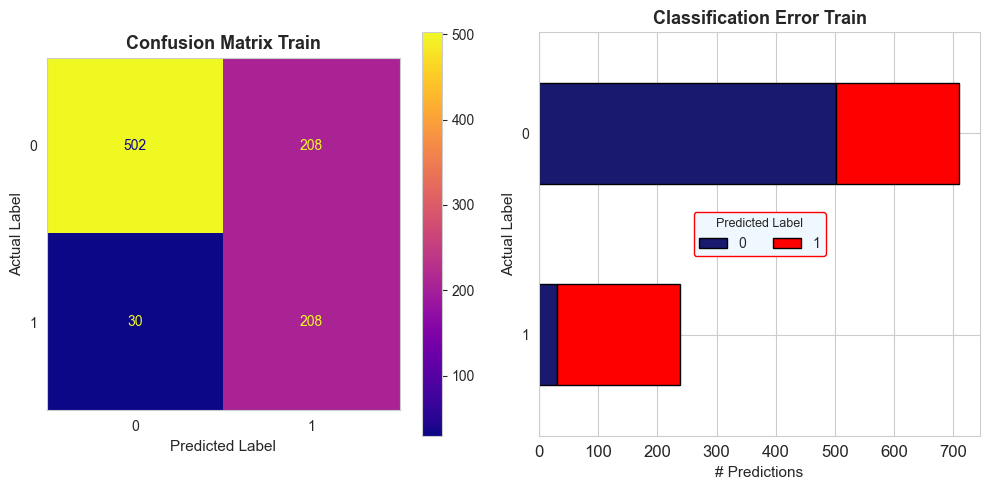

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 710 (75.0%)
- Class 1: 238 (25.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.943609,0.707042,0.808374,710.000000
1,0.500000,0.873950,0.636086,238.000000
accuracy,0.748945,0.748945,0.748945,0.748945
macro avg,0.721805,0.790496,0.722230,948.000000
weighted avg,0.832239,0.748945,0.765120,948.000000


In [59]:
classification_evaluation_report(
                        model       = model,
                        X           = X_train_smoke,
                        y           = y_train_smoke,
                        threshold   = 0.5,
                        figsize      = (10, 5),
                        title_suffix = 'Train'
)

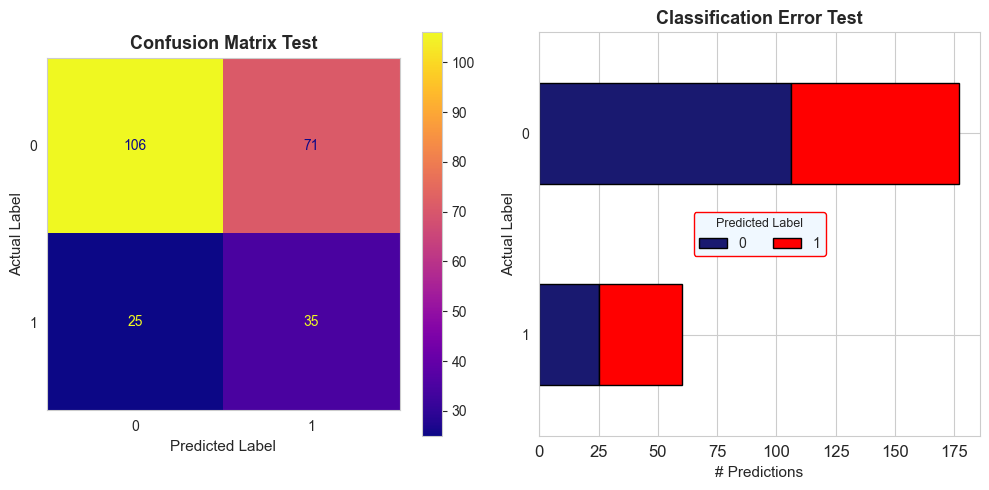

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 177 (75.0%)
- Class 1: 60 (25.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.809160,0.598870,0.688312,177.000000
1,0.330189,0.583333,0.421687,60.000000
accuracy,0.594937,0.594937,0.594937,0.594937
macro avg,0.569674,0.591102,0.554999,237.000000
weighted avg,0.687902,0.594937,0.620812,237.000000


In [60]:
classification_evaluation_report(
    model       = model,
    X           = X_test_smoke,
    y           = y_test_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Feature Importance Plot

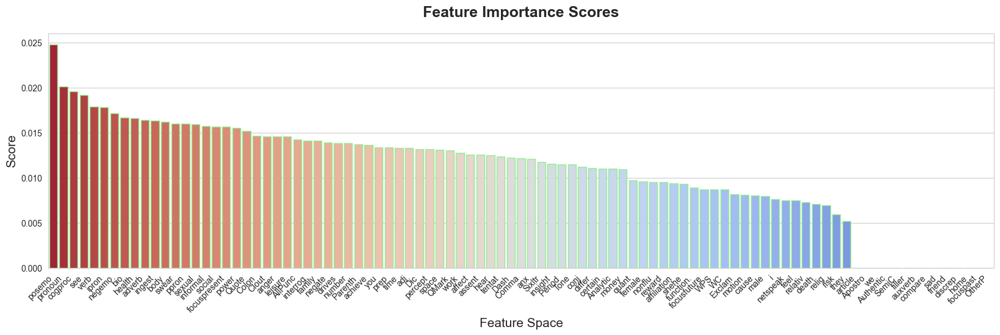

In [61]:
feature_importance_plot(
    model          = model,
    feature_names  = liwc,
    figsize         = (20, 5),
    horizontal=True
)

- Select features based on importance threshold:

In [62]:
# threshold for feature importance
threshold = float(input("Enter the threshold for feature importance: ")) 

# select features with importance above threshold
selected_tree_features = [f for f, s in zip(liwc, model.feature_importances_) if s >= threshold]

print(f"# features selected: {len(selected_tree_features)}")
print(f"Selected features: {selected_tree_features}")

# features selected: 20
Selected features: ['pronoun', 'ppron', 'ipron', 'adverb', 'verb', 'posemo', 'negemo', 'social', 'cogproc', 'see', 'bio', 'body', 'health', 'sexual', 'ingest', 'power', 'focuspresent', 'informal', 'swear', 'Quote']


#### 3.1.2) Retrain XGBoost with model-based-features:

- Optimization:

In [68]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 101)
    max_depth        = trial.suggest_int("max_depth", 2, 4)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-2, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_smoke,
                    eval_metric      = 'logloss',
                    random_state     = 42,
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_smoke[selected_tree_features],
                        y         = y_train_smoke,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-29 14:38:43,741] A new study created in memory with name: no-name-c4c21c89-c115-4af6-a25a-7e029306cd37
[I 2023-12-29 14:38:44,010] Trial 0 finished with value: 0.5564745356195141 and parameters: {'n_estimators': 90, 'max_depth': 2, 'min_child_weight': 9, 'subsample': 0.165330559627784, 'colsample_bytree': 0.002675222068845458, 'learning_rate': 0.02473978626594724, 'reg_alpha': 0.03633440075527224}. Best is trial 0 with value: 0.5564745356195141.
[I 2023-12-29 14:38:44,178] Trial 1 finished with value: 0.6119922433149622 and parameters: {'n_estimators': 81, 'max_depth': 2, 'min_child_weight': 4, 'subsample': 0.25789869335486465, 'colsample_bytree': 0.379558418479467, 'learning_rate': 0.11361569401636039, 'reg_alpha': 0.05605464395270489}. Best is trial 1 with value: 0.6119922433149622.
[I 2023-12-29 14:38:44,287] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 78, 'max_depth': 2, 'min_child_weight': 7, 'subsample': 0.007298515020984252, 'colsample_bytree': 0

___________________________________________________________________________________________________
Best trial: {'n_estimators': 89, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.16487264374242164, 'colsample_bytree': 0.9260693705115931, 'learning_rate': 0.007666715564171848, 'reg_alpha': 0.18148299600328469}


- Refit Model with best parameters:

In [69]:
# initialize XGBoost model with best parameters
model = XGBClassifier(
                n_estimators     = study.best_trial.params['n_estimators'],
                max_depth        = study.best_trial.params['max_depth'],
                min_child_weight = study.best_trial.params['min_child_weight'],
                subsample        = study.best_trial.params['subsample'],
                colsample_bytree = study.best_trial.params['colsample_bytree'],
                learning_rate    = study.best_trial.params['learning_rate'],
                reg_alpha        = study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_smoke,
                eval_metric      = 'logloss',
                random_state     = 42
)

# fit model on training data
model.fit(
    X_train_smoke[selected_tree_features],
    y_train_smoke
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9260693705115931, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.007666715564171848,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=89, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

- Evaluation:

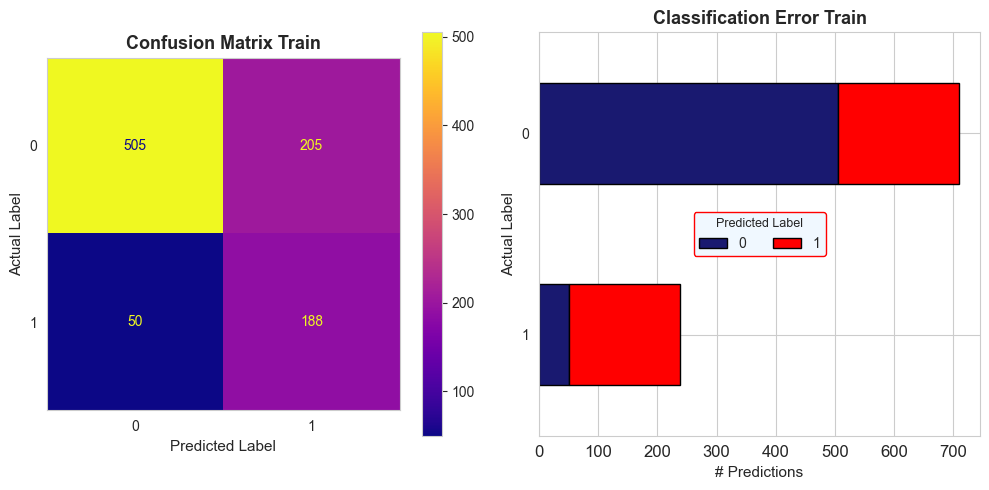

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 710 (75.0%)
- Class 1: 238 (25.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.909910,0.711268,0.798419,710.000000
1,0.478372,0.789916,0.595880,238.000000
accuracy,0.731013,0.731013,0.731013,0.731013
macro avg,0.694141,0.750592,0.697149,948.000000
weighted avg,0.801570,0.731013,0.747570,948.000000


In [70]:
classification_evaluation_report(
    model       = model,
    X           = X_train_smoke[selected_tree_features],
    y           = y_train_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

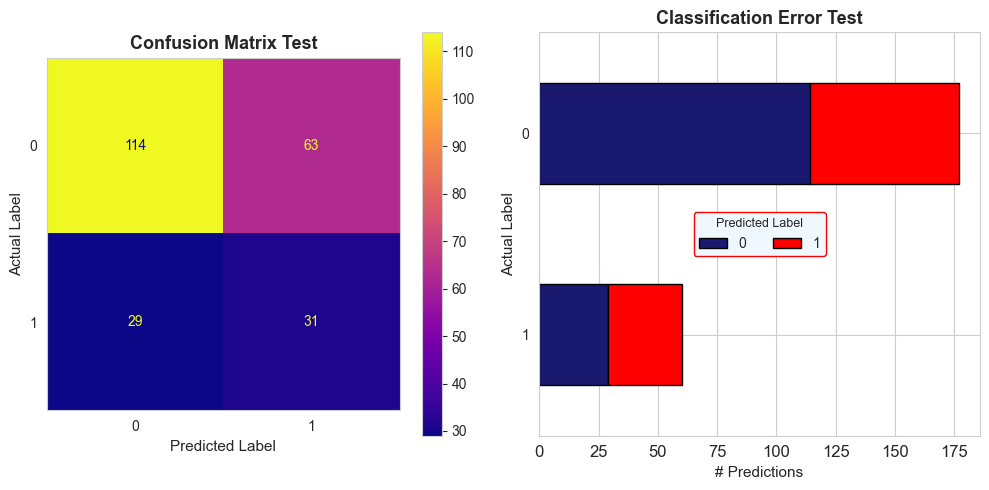

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 177 (75.0%)
- Class 1: 60 (25.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.797203,0.644068,0.712500,177.000000
1,0.329787,0.516667,0.402597,60.000000
accuracy,0.611814,0.611814,0.611814,0.611814
macro avg,0.563495,0.580367,0.557549,237.000000
weighted avg,0.678870,0.611814,0.634044,237.000000


In [71]:
classification_evaluation_report(
    model       = model,
    X           = X_test_smoke[selected_tree_features],
    y           = y_test_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Regularization against overfitting analysis:

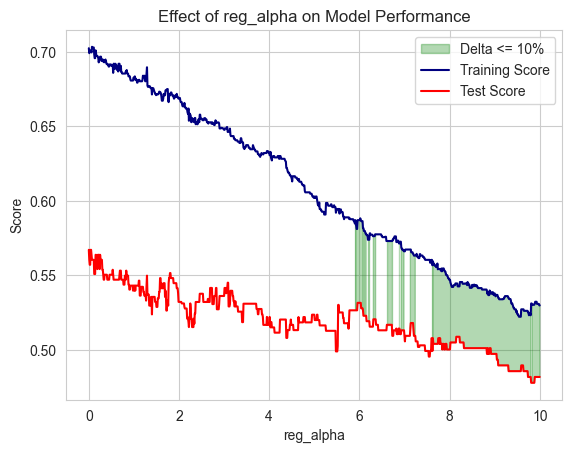

In [81]:
from sklearn.metrics import f1_score


reg_alpha_values = np.arange(0, 10.01, 0.01)
train_scores, test_scores = [], []

for alpha in reg_alpha_values:
    # initialize XGBoost model with best parameters
    model = XGBClassifier(
                    n_estimators     = study.best_trial.params['n_estimators'],
                    max_depth        = study.best_trial.params['max_depth'],
                    min_child_weight = study.best_trial.params['min_child_weight'],
                    subsample        = study.best_trial.params['subsample'],
                    colsample_bytree = study.best_trial.params['colsample_bytree'],
                    learning_rate    = study.best_trial.params['learning_rate'],
                    reg_alpha        = alpha,
                    scale_pos_weight = weight_smoke,
                    eval_metric      = 'logloss',
                    random_state     = 42
    )

    # fit model on training data
    model.fit(
        X_train_smoke[selected_tree_features],
        y_train_smoke
    )

    # predict on train and test sets
    y_train_pred = model.predict(X_train_smoke[selected_tree_features])
    y_test_pred  = model.predict(X_test_smoke[selected_tree_features])

    # calculate and append balanced accuracy scores
    train_scores.append(f1_score(y_train_smoke, y_train_pred, average='macro'))
    test_scores.append(f1_score(y_test_smoke, y_test_pred, average='macro'))

# Calculate the relative difference
relative_diff = np.abs(np.array(train_scores) - np.array(test_scores)) / np.array(train_scores)

# Identifying regions where the relative difference is <= 10%
threshold = 0.10
acceptable_diff = relative_diff <= threshold

# Determine the maximum and minimum scores at each point
max_scores = np.maximum(train_scores, test_scores)
min_scores = np.minimum(train_scores, test_scores)

# Filling the region within the threshold
plt.fill_between(reg_alpha_values, min_scores, max_scores, where=acceptable_diff, color='green', alpha=0.3, label='Delta <= 10%')

# Plotting the scores
plt.plot(reg_alpha_values, train_scores, label='Training Score', color='navy')
plt.plot(reg_alpha_values, test_scores, label='Test Score', color='red')

plt.xlabel('reg_alpha')
plt.ylabel('Score')
plt.title('Effect of reg_alpha on Model Performance')
plt.legend()
plt.show()

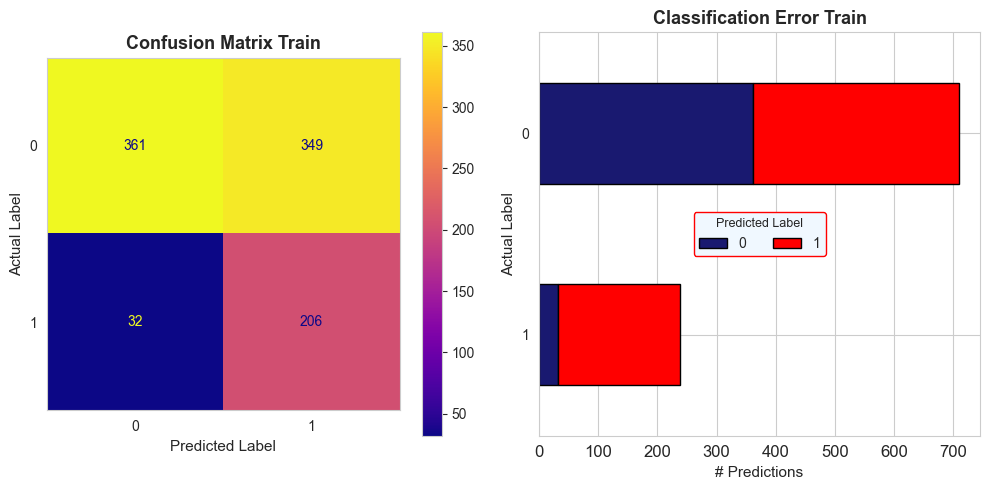

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 710 (75.0%)
- Class 1: 238 (25.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.918575,0.508451,0.654578,710.000000
1,0.371171,0.865546,0.519546,238.000000
accuracy,0.598101,0.598101,0.598101,0.598101
macro avg,0.644873,0.686998,0.587062,948.000000
weighted avg,0.781147,0.598101,0.620678,948.000000


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


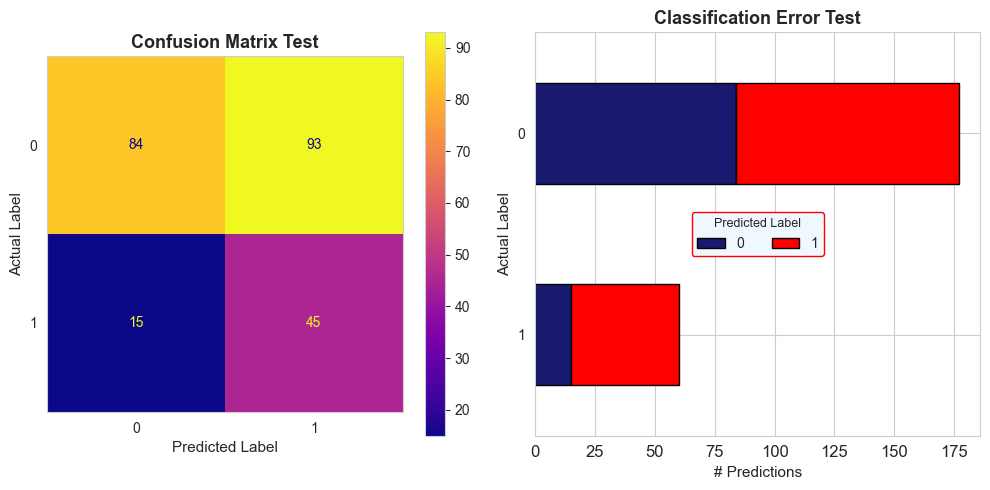

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 177 (75.0%)
- Class 1: 60 (25.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.848485,0.474576,0.608696,177.000000
1,0.326087,0.750000,0.454545,60.000000
accuracy,0.544304,0.544304,0.544304,0.544304
macro avg,0.587286,0.612288,0.531621,237.000000
weighted avg,0.716232,0.544304,0.569670,237.000000


In [80]:
reg_alpha = 6.0

# initialize XGBoost model with best parameters
model = XGBClassifier(
                n_estimators     = study.best_trial.params['n_estimators'],
                max_depth        = study.best_trial.params['max_depth'],
                min_child_weight = study.best_trial.params['min_child_weight'],
                subsample        = study.best_trial.params['subsample'],
                colsample_bytree = study.best_trial.params['colsample_bytree'],
                learning_rate    = study.best_trial.params['learning_rate'],
                reg_alpha        = reg_alpha,
                scale_pos_weight = weight_smoke,
                eval_metric      = 'logloss',
                random_state     = 42
    )

    # fit model on training data
model.fit(
    X_train_smoke[selected_tree_features],
    y_train_smoke
)

classification_evaluation_report(
    model       = model,
    X           = X_train_smoke[selected_tree_features],
    y           = y_train_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)
print(99*'~')
classification_evaluation_report(
    model       = model,
    X           = X_test_smoke[selected_tree_features],
    y           = y_test_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

#### 3.1.3) XGBoost with ANOVA features:

In [101]:
from sklearn.metrics import roc_auc_score, make_scorer, matthews_corrcoef, cohen_kappa_score

- Optimize:

In [107]:
len(smoking_anova_features)

22

In [112]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 3, 70)
    max_depth        = trial.suggest_int("max_depth", 2, 4)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-2, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_smoke,
                    eval_metric      = 'logloss',
                    random_state     = 42,
    )

    # F1 scorer
    #f1_scorer = make_scorer(f1_score, average='macro')

    # Balanced accuracy scorer
    #bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # roc_auc scorer
    roc_auc_scorer = make_scorer(roc_auc_score, needs_proba=True)

    # Matthews correlation coefficient scorer
    #mcc_scorer = make_scorer(matthews_corrcoef)

    # Cohen's kappa scorer
    #kappa_scorer = make_scorer(cohen_kappa_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_smoke[smoking_anova_features],
                        y         = y_train_smoke,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = roc_auc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-29 17:13:46,443] A new study created in memory with name: no-name-66c86be7-f387-43d7-a45f-67858b976ccd
[I 2023-12-29 17:13:46,648] Trial 0 finished with value: 0.6765334762196367 and parameters: {'n_estimators': 61, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.1814353610623405, 'colsample_bytree': 0.0338958193754126, 'learning_rate': 0.033711936879085025, 'reg_alpha': 0.10924446788129526}. Best is trial 0 with value: 0.6765334762196367.
[I 2023-12-29 17:13:46,765] Trial 1 finished with value: 0.6453255766482956 and parameters: {'n_estimators': 27, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.2573271091311846, 'colsample_bytree': 0.003824399305573668, 'learning_rate': 0.024886340252272553, 'reg_alpha': 0.011516389158847968}. Best is trial 0 with value: 0.6765334762196367.
[I 2023-12-29 17:13:46,888] Trial 2 finished with value: 0.7068815064298837 and parameters: {'n_estimators': 56, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.45942952673000836, 'co

___________________________________________________________________________________________________
Best trial: {'n_estimators': 66, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.12811223381047648, 'colsample_bytree': 0.6386971857100243, 'learning_rate': 0.006999714908889755, 'reg_alpha': 0.014668398975849968}


- Refit:

In [113]:
best_params = study.best_trial.params

# initialize XGBoost model with best parameters
model = XGBClassifier(
                n_estimators     = best_params['n_estimators'],
                max_depth        = best_params['max_depth'],
                min_child_weight = best_params['min_child_weight'],
                subsample        = best_params['subsample'],
                colsample_bytree = best_params['colsample_bytree'],
                learning_rate    = best_params['learning_rate'],
                reg_alpha        = best_params['reg_alpha'],
                scale_pos_weight = weight_smoke,
                eval_metric      = 'logloss',
                random_state     = 42
)

# fit model on training data
model.fit(X_train_smoke[smoking_anova_features], y_train_smoke)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6386971857100243, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.006999714908889755,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=66, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

- Evaluate:

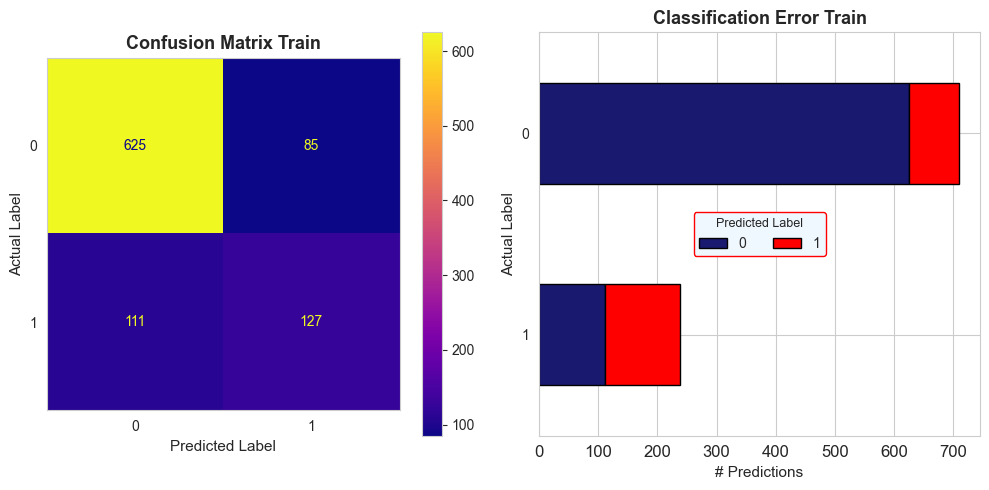

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 710 (75.0%)
- Class 1: 238 (25.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.849185,0.880282,0.864454,710.000000
1,0.599057,0.533613,0.564444,238.000000
accuracy,0.793249,0.793249,0.793249,0.793249
macro avg,0.724121,0.706948,0.714449,948.000000
weighted avg,0.786389,0.793249,0.789135,948.000000


In [114]:
classification_evaluation_report(
                        model       = model,
                        X           = X_train_smoke[smoking_anova_features],
                        y           = y_train_smoke,
                        threshold   = 0.5,
                        figsize      = (10, 5),
                        title_suffix = 'Train'
)

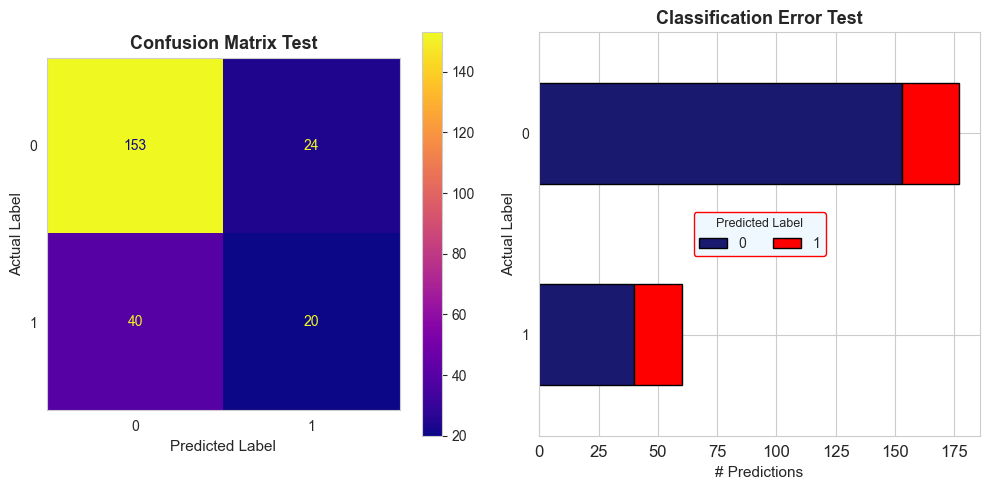

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 177 (75.0%)
- Class 1: 60 (25.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.792746,0.864407,0.827027,177.000000
1,0.454545,0.333333,0.384615,60.000000
accuracy,0.729958,0.729958,0.729958,0.729958
macro avg,0.623646,0.598870,0.605821,237.000000
weighted avg,0.707126,0.729958,0.715024,237.000000


In [115]:
classification_evaluation_report(
    model       = model,
    X           = X_test_smoke[smoking_anova_features],
    y           = y_test_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

### 3.2) SVM
#### 3.2.1) SVM with ANOVA features

In [42]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

- Scale data:

In [46]:
# select anova features:
X_train_smoke_anova, X_test_smoke_anova = X_train_smoke[smoking_anova_features], X_test_smoke[smoking_anova_features]

scaler = StandardScaler()
X_train_smoke_anova_scaled = scaler.fit_transform(X_train_smoke_anova)
X_test_smoke_anova_scaled  = scaler.transform(X_test_smoke_anova)

- Optimize:

In [66]:
import optuna


def objective(trial):
    # Hyperparameter suggestions
    C = trial.suggest_loguniform('C', 1e-10, 1e10)
    gamma = trial.suggest_loguniform('gamma', 1e-10, 1e10)
    kernel = trial.suggest_categorical('kernel', ['rbf', 'poly', 'sigmoid'])

    # SVM model
    model = SVC(
                C     = C,
                gamma = gamma,
                kernel = kernel,
                probability=True, # enable probability estimates
                class_weight = {0: 1, 1: weight_smoke}
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_smoke_anova_scaled,
                        y         = y_train_smoke,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=9, timeout=4000, show_progress_bar=True)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-27 13:12:25,993] A new study created in memory with name: no-name-855c3abe-d76d-4392-a64f-b4284ade9c5f
  0%|          | 0/9 [00:00<?, ?it/s]

Best trial: 0. Best value: 0.508245:  11%|█         | 1/9 [00:00<00:04,  1.63it/s, 0.61/4000 seconds]

[I 2023-12-27 13:12:26,605] Trial 0 finished with value: 0.5082453051643192 and parameters: {'C': 1280756214.9276247, 'gamma': 6.860058901791046e-06, 'kernel': 'poly'}. Best is trial 0 with value: 0.5082453051643192.


Best trial: 0. Best value: 0.508245:  22%|██▏       | 2/9 [00:01<00:04,  1.57it/s, 1.27/4000 seconds]

[I 2023-12-27 13:12:27,275] Trial 1 finished with value: 0.5 and parameters: {'C': 1.3472319918718207e-07, 'gamma': 47104.29216419165, 'kernel': 'sigmoid'}. Best is trial 0 with value: 0.5082453051643192.


Best trial: 0. Best value: 0.508245:  33%|███▎      | 3/9 [00:01<00:03,  1.55it/s, 1.92/4000 seconds]

[I 2023-12-27 13:12:27,926] Trial 2 finished with value: 0.5 and parameters: {'C': 8.546461726771473e-09, 'gamma': 1.5481341725873667, 'kernel': 'rbf'}. Best is trial 0 with value: 0.5082453051643192.


Best trial: 0. Best value: 0.508245:  44%|████▍     | 4/9 [00:02<00:03,  1.62it/s, 2.49/4000 seconds]

[I 2023-12-27 13:12:28,501] Trial 3 finished with value: 0.5 and parameters: {'C': 53.05060531251096, 'gamma': 2770570502.483515, 'kernel': 'rbf'}. Best is trial 0 with value: 0.5082453051643192.


Best trial: 0. Best value: 0.508245:  56%|█████▌    | 5/9 [00:03<00:02,  1.64it/s, 3.09/4000 seconds]

[I 2023-12-27 13:12:29,103] Trial 4 finished with value: 0.5 and parameters: {'C': 0.002791653804408713, 'gamma': 8.06132091513639e-05, 'kernel': 'rbf'}. Best is trial 0 with value: 0.5082453051643192.


Best trial: 5. Best value: 0.582879:  67%|██████▋   | 6/9 [00:03<00:01,  1.81it/s, 3.53/4000 seconds]

[I 2023-12-27 13:12:29,539] Trial 5 finished with value: 0.5828791590120433 and parameters: {'C': 1.05999482518375, 'gamma': 1.752410984292901, 'kernel': 'sigmoid'}. Best is trial 5 with value: 0.5828791590120433.


Best trial: 5. Best value: 0.582879:  78%|███████▊  | 7/9 [00:04<00:01,  1.46it/s, 4.49/4000 seconds]

[I 2023-12-27 13:12:30,497] Trial 6 finished with value: 0.5 and parameters: {'C': 2.7021887991645308e-05, 'gamma': 0.03419612867373029, 'kernel': 'rbf'}. Best is trial 5 with value: 0.5828791590120433.


Best trial: 5. Best value: 0.582879:  89%|████████▉ | 8/9 [00:05<00:00,  1.42it/s, 5.23/4000 seconds]

[I 2023-12-27 13:12:31,241] Trial 7 finished with value: 0.5 and parameters: {'C': 0.0005726101608559861, 'gamma': 0.0034133664220582405, 'kernel': 'rbf'}. Best is trial 5 with value: 0.5828791590120433.


Best trial: 5. Best value: 0.582879: 100%|██████████| 9/9 [00:05<00:00,  1.53it/s, 5.89/4000 seconds]

[I 2023-12-27 13:12:31,900] Trial 8 finished with value: 0.5 and parameters: {'C': 2.914234905216606e-05, 'gamma': 9991.884728328707, 'kernel': 'rbf'}. Best is trial 5 with value: 0.5828791590120433.
___________________________________________________________________________________________________
Best trial: {'C': 1.05999482518375, 'gamma': 1.752410984292901, 'kernel': 'sigmoid'}


- Refit:

In [67]:
best_params = study.best_trial.params

# initialize SVM model with best parameters
model = SVC(
            C     = best_params['C'],
            gamma = best_params['gamma'],
            kernel = best_params['kernel'],
            probability=True, # enable probability estimates
            #class_weight = {0: 1, 1: weight_smoke}
)

# fit model on training data
model.fit(X_train_smoke_anova_scaled, y_train_smoke)

SVC(C=1.05999482518375, gamma=1.752410984292901, kernel='sigmoid',
    probability=True)

- Evaluation:

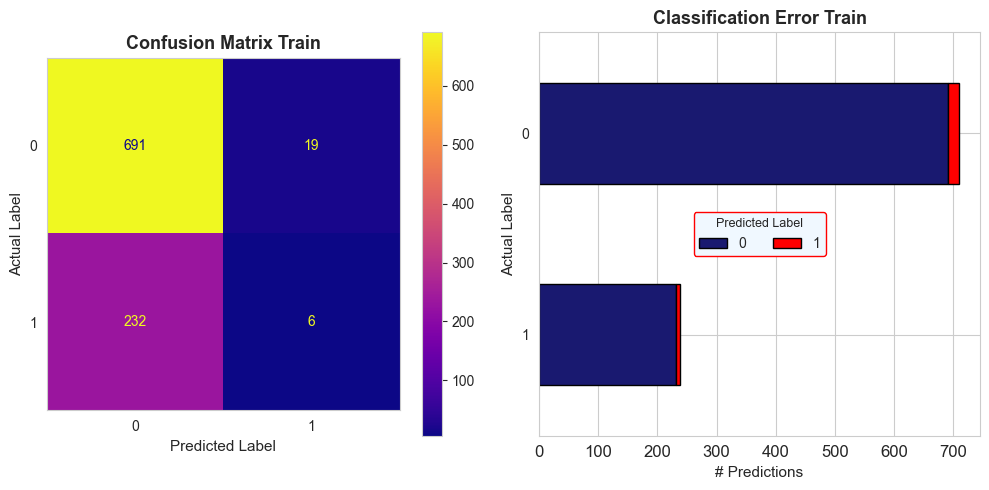

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 710 (75.0%)
- Class 1: 238 (25.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.748646,0.973239,0.846295,710.000000
1,0.240000,0.025210,0.045627,238.000000
accuracy,0.735232,0.735232,0.735232,0.735232
macro avg,0.494323,0.499225,0.445961,948.000000
weighted avg,0.620948,0.735232,0.645284,948.000000


In [68]:
classification_evaluation_report(
    model       = model,
    X           = X_train_smoke_anova_scaled,
    y           = y_train_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

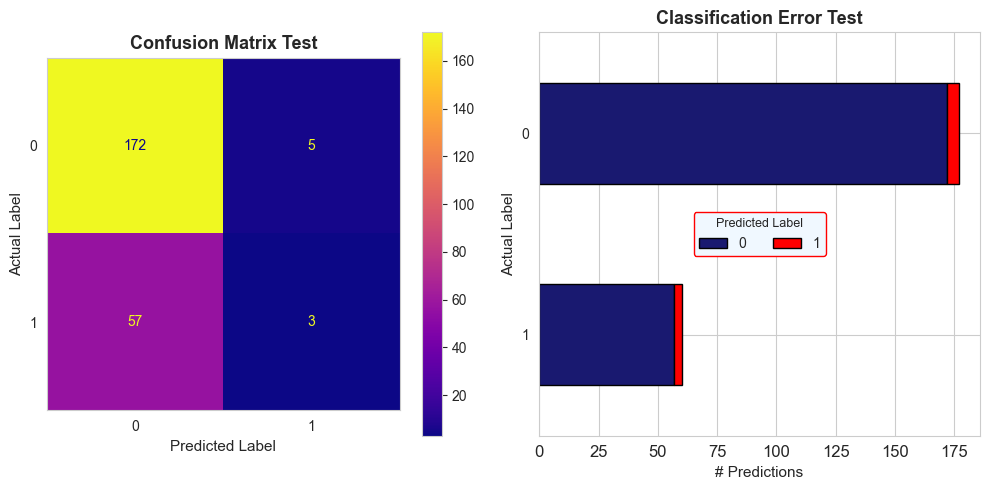

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 177 (75.0%)
- Class 1: 60 (25.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.751092,0.971751,0.847291,177.000000
1,0.375000,0.050000,0.088235,60.000000
accuracy,0.738397,0.738397,0.738397,0.738397
macro avg,0.563046,0.510876,0.467763,237.000000
weighted avg,0.655879,0.738397,0.655125,237.000000


In [69]:
classification_evaluation_report(
    model       = model,
    X           = X_test_smoke_anova_scaled,
    y           = y_test_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

### 3.2) LogReg
#### 3.2.1) LogReg with ANOVA features

In [58]:
from sklearn.linear_model import LogisticRegression

In [59]:
def objective(trial):
    # Hyperparameter suggestions
    C = trial.suggest_loguniform('C', 1e-10, 1e10)
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])

    # Logistic Regression model
    model = LogisticRegression(
                C       = C,
                penalty = penalty,
                solver  = 'liblinear',
                class_weight = {0: 1, 1: weight_smoke}
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_smoke_anova_scaled,
                        y         = y_train_smoke,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=9, timeout=4000, show_progress_bar=True)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-27 13:06:04,447] A new study created in memory with name: no-name-ad8898a2-b939-42e5-8102-88c4994696e0
Best trial: 1. Best value: 0.677424:  56%|█████▌    | 5/9 [00:03<00:02,  1.50it/s, 3.52/4000 seconds]

[I 2023-12-27 13:06:07,803] Trial 0 finished with value: 0.6760129618289448 and parameters: {'C': 1212865650.440521, 'penalty': 'l2'}. Best is trial 0 with value: 0.6760129618289448.
[I 2023-12-27 13:06:07,855] Trial 1 finished with value: 0.677423964074301 and parameters: {'C': 0.008749826770718873, 'penalty': 'l2'}. Best is trial 1 with value: 0.677423964074301.
[I 2023-12-27 13:06:07,890] Trial 2 finished with value: 0.6669537150438865 and parameters: {'C': 2.9180954300857677e-09, 'penalty': 'l2'}. Best is trial 1 with value: 0.677423964074301.
[I 2023-12-27 13:06:07,930] Trial 3 finished with value: 0.5 and parameters: {'C': 3.999403713775964e-08, 'penalty': 'l1'}. Best is trial 1 with value: 0.677423964074301.
[I 2023-12-27 13:06:07,966] Trial 4 finished with value: 0.6690663911002245 and parameters: {'C': 0.00017680109688200985, 'penalty': 'l2'}. Best is trial 1 with value: 0.677423964074301.


Best trial: 1. Best value: 0.677424: 100%|██████████| 9/9 [00:03<00:00,  2.45it/s, 3.68/4000 seconds]

[I 2023-12-27 13:06:08,010] Trial 5 finished with value: 0.6753087364768321 and parameters: {'C': 0.4042977306537219, 'penalty': 'l2'}. Best is trial 1 with value: 0.677423964074301.
[I 2023-12-27 13:06:08,055] Trial 6 finished with value: 0.6760129618289448 and parameters: {'C': 134.26652742922724, 'penalty': 'l2'}. Best is trial 1 with value: 0.677423964074301.
[I 2023-12-27 13:06:08,092] Trial 7 finished with value: 0.6760129618289448 and parameters: {'C': 0.3049946545666334, 'penalty': 'l2'}. Best is trial 1 with value: 0.677423964074301.
[I 2023-12-27 13:06:08,125] Trial 8 finished with value: 0.5 and parameters: {'C': 9.951754532567843e-10, 'penalty': 'l1'}. Best is trial 1 with value: 0.677423964074301.
___________________________________________________________________________________________________
Best trial: {'C': 0.008749826770718873, 'penalty': 'l2'}


- Evaluate:

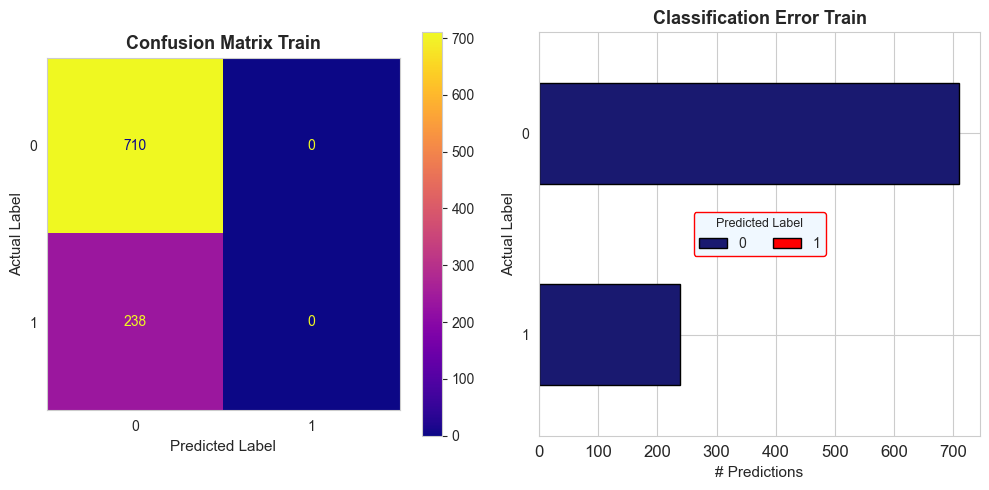

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 710 (75.0%)
- Class 1: 238 (25.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
0,0.748945,1.000000,0.856454,710.000000
1,0.000000,0.000000,0.000000,238.000000
accuracy,0.748945,0.748945,0.748945,0.748945
macro avg,0.374473,0.500000,0.428227,948.000000
weighted avg,0.560919,0.748945,0.641437,948.000000


In [60]:
classification_evaluation_report(
    model       = model,
    X           = X_train_smoke_anova_scaled,
    y           = y_train_smoke,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

## **4) Target Alcohol**
---

### 4.1) XGBoost
#### 4.1.1) Baseline with all features

- Optimization:

In [48]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 299)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_alc,
                    eval_metric      = 'logloss',
                    random_state     = 42,
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_alc,
                        y         = y_train_alc,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=99, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-03 12:51:21,226] A new study created in memory with name: no-name-0bab28fb-7b78-41ff-b5c9-05f87979f9dd
[I 2023-12-03 12:51:25,397] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 259, 'max_depth': 7, 'min_child_weight': 6, 'subsample': 0.0212444496286997, 'colsample_bytree': 0.004559201592032428, 'learning_rate': 0.2968575204398615, 'reg_alpha': 0.00010658342772484173}. Best is trial 0 with value: 0.5.
[I 2023-12-03 12:51:25,898] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 276, 'max_depth': 7, 'min_child_weight': 9, 'subsample': 0.016187197325829433, 'colsample_bytree': 0.07864238775121841, 'learning_rate': 0.0018383082959678935, 'reg_alpha': 6.987058279675763e-06}. Best is trial 0 with value: 0.5.
[I 2023-12-03 12:51:27,582] Trial 2 finished with value: 0.6420215912451938 and parameters: {'n_estimators': 289, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.34375492438103616, 'colsample_bytree': 0.43673951216147694, 'learning_rat

___________________________________________________________________________________________________
Best trial: {'n_estimators': 232, 'max_depth': 8, 'min_child_weight': 6, 'subsample': 0.15359001931285152, 'colsample_bytree': 0.17554631815500488, 'learning_rate': 0.0663427688330467, 'reg_alpha': 0.005612486590502924}


- Refit model with best parameters:
  - good results but slight overfitt with:
    Best trial: {'n_estimators': 232, 'max_depth': 8, 'min_child_weight': 6, 'subsample': 0.15359001931285152, 'colsample_bytree': 0.17554631815500488, 'learning_rate': 0.0663427688330467, 'reg_alpha': 0.005612486590502924}


In [49]:
model = XGBClassifier(
                n_estimators     = study.best_trial.params['n_estimators'],
                max_depth        = study.best_trial.params['max_depth'],
                min_child_weight = study.best_trial.params['min_child_weight'],
                subsample        = study.best_trial.params['subsample'],
                colsample_bytree = study.best_trial.params['colsample_bytree'],
                learning_rate    = study.best_trial.params['learning_rate'],
                reg_alpha        = study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# fit model on training data
model.fit(
    X_train_alc,
    y_train_alc
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.17554631815500488, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0663427688330467,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=232, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate:

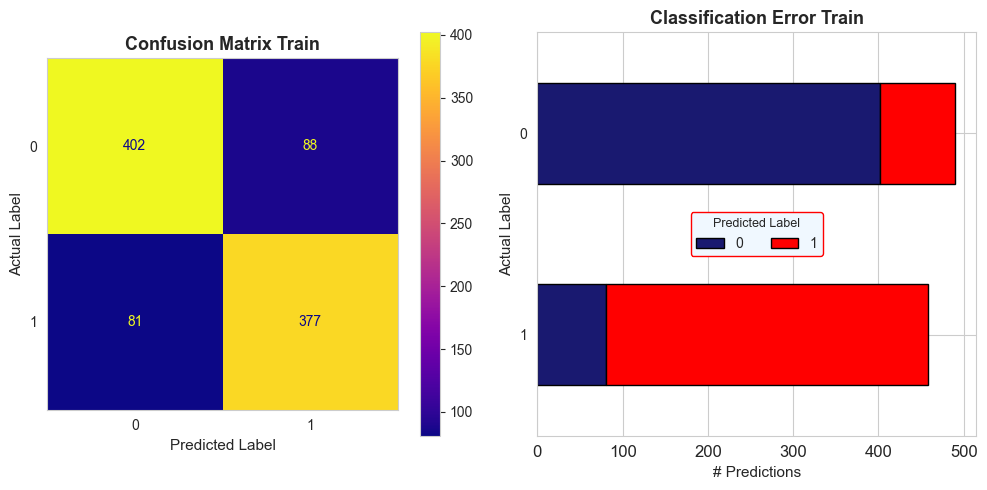

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 490 (52.0%)
- Class 1: 458 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.832298,0.820408,0.826310,490.000000
1,0.810753,0.823144,0.816901,458.000000
accuracy,0.821730,0.821730,0.821730,0.821730
macro avg,0.821525,0.821776,0.821606,948.000000
weighted avg,0.821889,0.821730,0.821765,948.000000


In [50]:
classification_evaluation_report(
    model       = model,
    X           = X_train_alc,
    y           = y_train_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

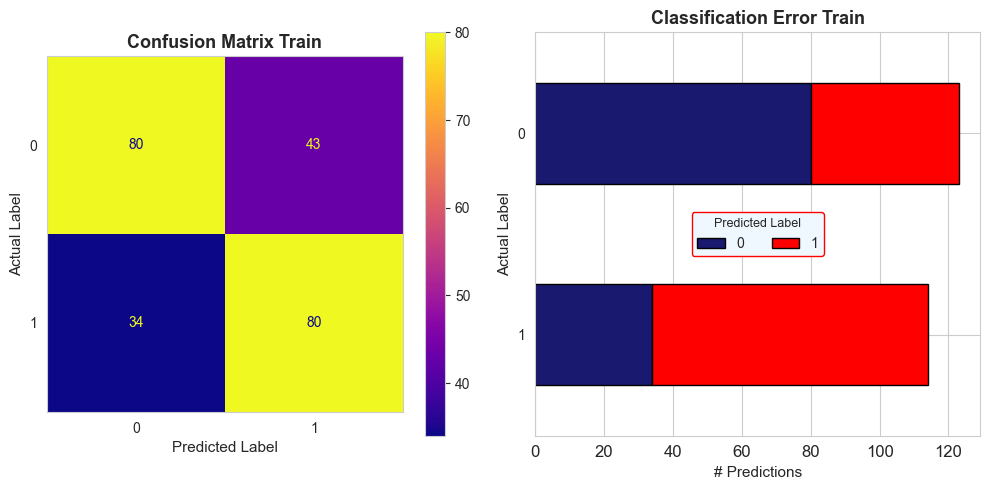

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 123 (52.0%)
- Class 1: 114 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.701754,0.650407,0.675105,123.000000
1,0.650407,0.701754,0.675105,114.000000
accuracy,0.675105,0.675105,0.675105,0.675105
macro avg,0.676080,0.676080,0.675105,237.000000
weighted avg,0.677055,0.675105,0.675105,237.000000


In [51]:
classification_evaluation_report(
    model       = model,
    X           = X_test_alc,
    y           = y_test_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

- Feature Importance:

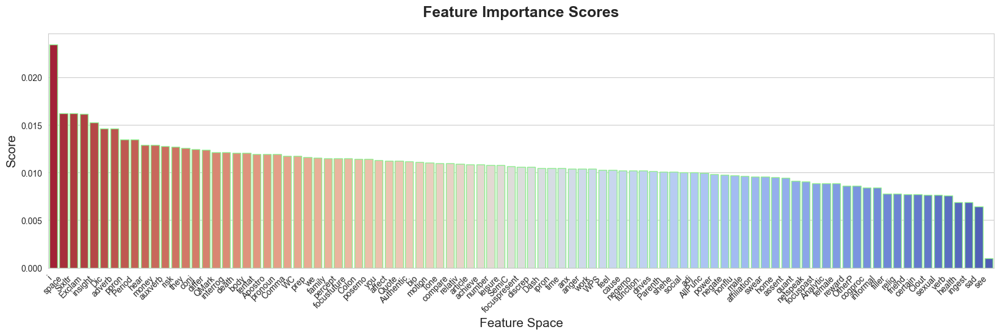

In [52]:
feature_importance_plot(
    model          = model,
    feature_names  = liwc,
    figsize         = (20, 5),
    horizontal     = False
)

- Select features:

In [94]:
# threshold for feature importance
threshold = float(input("Enter the threshold for feature importance: ")) # 0.0075

# select features with importance above threshold
selected_tree_features = [f for f, s in zip(liwc, model.feature_importances_) if s >= threshold]
print(f"Threshold: {threshold}")
print(f"# features selected: {len(selected_tree_features)}")
print(f"Selected features: {selected_tree_features}")

Threshold: 0.0075
# features selected: 77
Selected features: ['WC', 'Analytic', 'Clout', 'Authentic', 'Tone', 'WPS', 'Sixltr', 'Dic', 'pronoun', 'ppron', 'i', 'we', 'you', 'shehe', 'they', 'ipron', 'adverb', 'conj', 'negate', 'adj', 'compare', 'number', 'quant', 'affect', 'posemo', 'negemo', 'anx', 'anger', 'sad', 'social', 'family', 'female', 'male', 'cogproc', 'insight', 'cause', 'discrep', 'tentat', 'certain', 'differ', 'see', 'hear', 'feel', 'body', 'health', 'ingest', 'drives', 'affiliation', 'achieve', 'power', 'reward', 'risk', 'focuspast', 'focuspresent', 'focusfuture', 'relativ', 'motion', 'space', 'time', 'work', 'home', 'money', 'death', 'informal', 'swear', 'netspeak', 'nonflu', 'AllPunc', 'Period', 'Comma', 'SemiC', 'QMark', 'Dash', 'Quote', 'Apostro', 'Parenth', 'OtherP']


In [18]:
selected_tree_features = ['WC', 'Analytic', 'Clout', 'Authentic', 'Tone', 'WPS', 'Sixltr', 'Dic', 'pronoun', 'ppron', 'i', 'we', 'you', 'shehe', 'they', 'ipron', 'adverb', 'conj', 'negate', 'adj', 'compare', 'number', 'quant', 'affect', 'posemo', 'negemo', 'anx', 'anger', 'sad', 'social', 'family', 'female', 'male', 'cogproc', 'insight', 'cause', 'discrep', 'tentat', 'certain', 'differ', 'see', 'hear', 'feel', 'body', 'health', 'ingest', 'drives', 'affiliation', 'achieve', 'power', 'reward', 'risk', 'focuspast', 'focuspresent', 'focusfuture', 'relativ', 'motion', 'space', 'time', 'work', 'home', 'money', 'death', 'informal', 'swear', 'netspeak', 'nonflu', 'AllPunc', 'Period', 'Comma', 'SemiC', 'QMark', 'Dash', 'Quote', 'Apostro', 'Parenth', 'OtherP']
len(selected_tree_features)

77

#### 4.1.2) Retrain Model with Model-based-features

- Optimization:

In [95]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 299)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_alc,
                    eval_metric      = 'logloss',
                    random_state     = 42,
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_alc[selected_tree_features],
                        y         = y_train_alc,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=99, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-03 14:47:29,118] A new study created in memory with name: no-name-9abdc8fb-c7f3-45bb-8cda-ce8273adca66
[I 2023-12-03 14:47:33,649] Trial 0 finished with value: 0.555119787045253 and parameters: {'n_estimators': 82, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.5392886305097082, 'colsample_bytree': 0.012083461281089903, 'learning_rate': 0.012428925223377005, 'reg_alpha': 0.00020991188371265946}. Best is trial 0 with value: 0.555119787045253.
[I 2023-12-03 14:47:39,077] Trial 1 finished with value: 0.6297747214827959 and parameters: {'n_estimators': 284, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.41491048233508293, 'colsample_bytree': 0.39971645016967844, 'learning_rate': 0.0023715566608844643, 'reg_alpha': 0.005645675850889327}. Best is trial 1 with value: 0.6297747214827959.
[I 2023-12-03 14:47:39,499] Trial 2 finished with value: 0.6068781425613724 and parameters: {'n_estimators': 63, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.6494279460862536,

___________________________________________________________________________________________________
Best trial: {'n_estimators': 186, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.18465100138394708, 'colsample_bytree': 0.48440775337725545, 'learning_rate': 0.009729767944171503, 'reg_alpha': 0.04329879689185605}


- Refit model with best parameters:

  - `Best Run with:` {'n_estimators': 224, 'max_depth': 7, 'min_child_weight': 9, 'subsample': 0.12355666615302838, 'colsample_bytree': 0.9862291367123937, 'learning_rate': 0.006660792007777449, 'reg_alpha': 0.050613160121819864}

  - `even better trial:` {'n_estimators': 186, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.18465100138394708, 'colsample_bytree': 0.48440775337725545, 'learning_rate': 0.009729767944171503, 'reg_alpha': 0.04329879689185605}

In [19]:
model = XGBClassifier(
                n_estimators     = 186, #study.best_trial.params['n_estimators'],
                max_depth        = 6, #study.best_trial.params['max_depth'],
                min_child_weight = 6, #study.best_trial.params['min_child_weight'],
                subsample        = 0.18465100138394708, #study.best_trial.params['subsample'],
                colsample_bytree = 0.48440775337725545, #study.best_trial.params['colsample_bytree'],
                learning_rate    = 0.009729767944171503, #study.best_trial.params['learning_rate'],
                reg_alpha        = 0.04329879689185605, #study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss',
                #random_state     = 42         # get back earlier better results
)

# fit model on training data
model.fit(
    X_train_alc[selected_tree_features],
    y_train_alc
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.48440775337725545, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.009729767944171503,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=186, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate

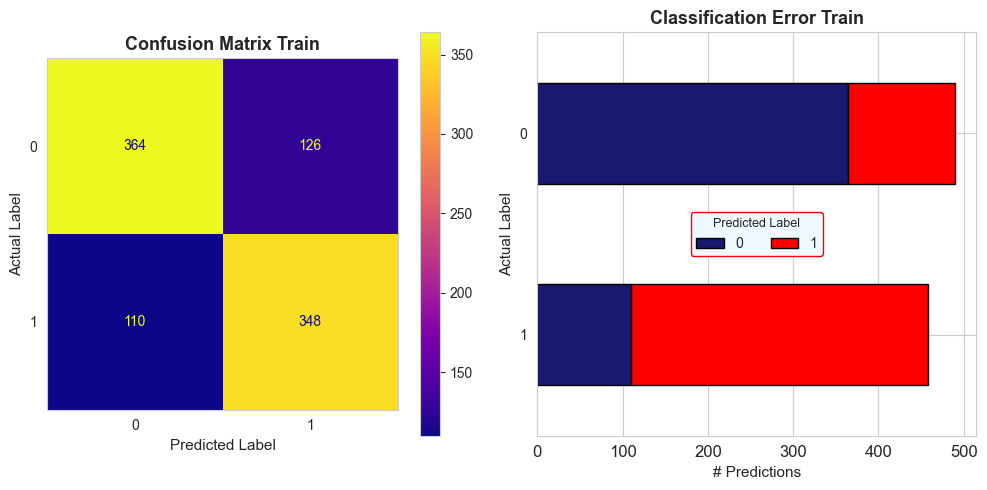

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 490 (52.0%)
- Class 1: 458 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.767932,0.742857,0.755187,490.000000
1,0.734177,0.759825,0.746781,458.000000
accuracy,0.751055,0.751055,0.751055,0.751055
macro avg,0.751055,0.751341,0.750984,948.000000
weighted avg,0.751625,0.751055,0.751126,948.000000


In [20]:
classification_evaluation_report(
    model       = model,
    X           = X_train_alc[selected_tree_features],
    y           = y_train_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

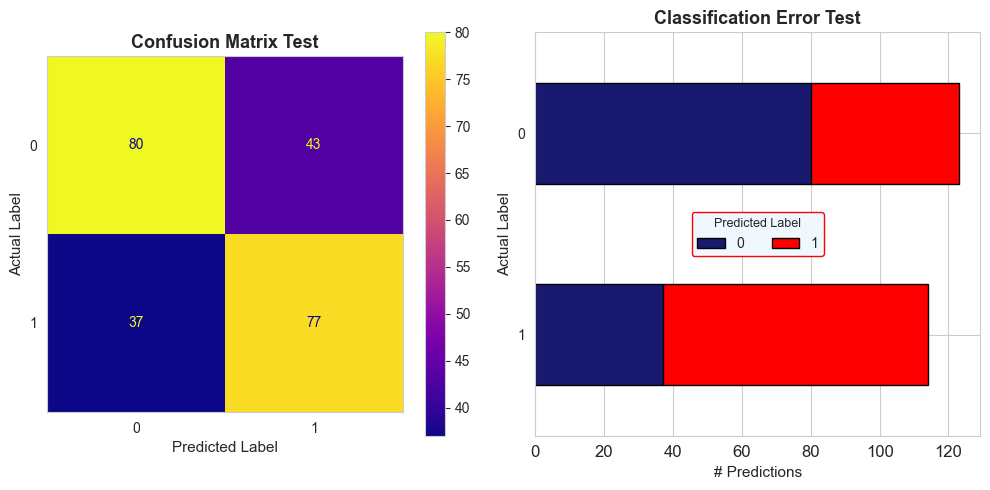

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 123 (52.0%)
- Class 1: 114 (48.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.683761,0.650407,0.666667,123.000000
1,0.641667,0.675439,0.658120,114.000000
accuracy,0.662447,0.662447,0.662447,0.662447
macro avg,0.662714,0.662923,0.662393,237.000000
weighted avg,0.663513,0.662447,0.662555,237.000000


In [21]:
classification_evaluation_report(
    model       = model,
    X           = X_test_alc[selected_tree_features],
    y           = y_test_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Shap:

/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning:

[13:05:09] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



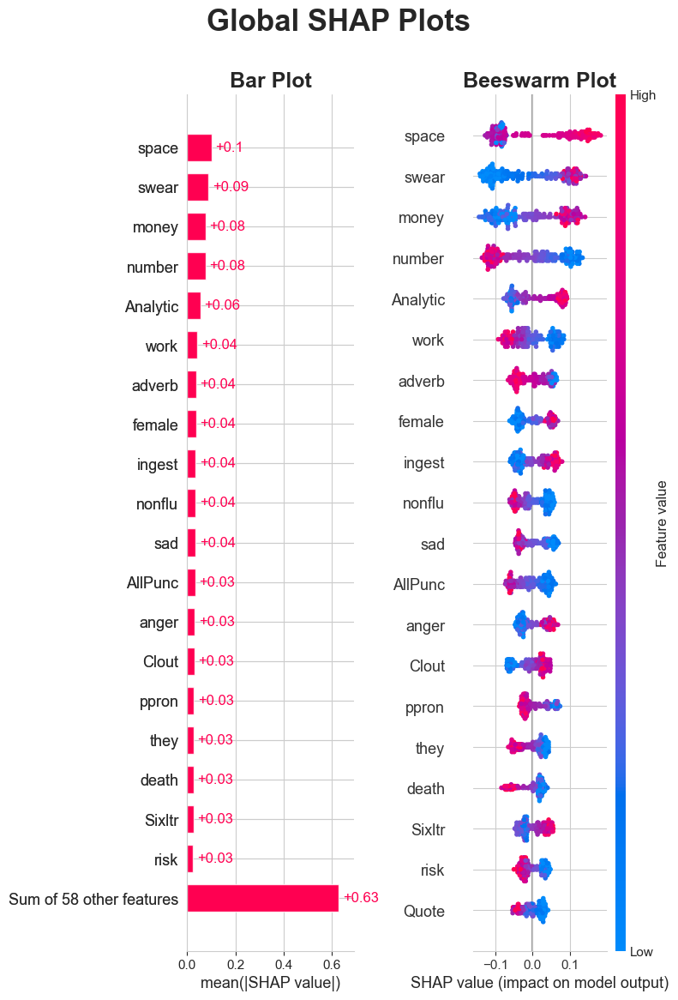

In [24]:
global_shap_plots_tree(
    model    = model,
    X        = X_test_alc[selected_tree_features],
    figsize  = (20, 10),
    max_display=20
)

#### 4.1.3)  `Recursive Feature Selection:`

- Refit with previously obtained hyperparameters:

In [25]:
# rfe
from sklearn.feature_selection import RFECV

# initialize XGBoost model with best parameters

model = XGBClassifier(
                n_estimators     = 186, #study.best_trial.params['n_estimators'],
                max_depth        = 6, #study.best_trial.params['max_depth'],
                min_child_weight = 6, #study.best_trial.params['min_child_weight'],
                subsample        = 0.18465100138394708, #study.best_trial.params['subsample'],
                colsample_bytree = 0.48440775337725545, #study.best_trial.params['colsample_bytree'],
                learning_rate    = 0.009729767944171503, #study.best_trial.params['learning_rate'],
                reg_alpha        = 0.04329879689185605, #study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# initialize RFECV
rfecv = RFECV(
            estimator = model,
            step      = 1,
            cv        = StratifiedKFold(10),
            scoring   = 'balanced_accuracy',
            n_jobs    = -1
)

# fit RFECV on training data
rfecv.fit(X_train_alc[selected_tree_features], y_train_alc)

RFECV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
      estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=0.48440775337725545, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric='logloss',
                              feature_types=None, gamma=None, grow_policy=No...
                              interaction_constraints=None,
                              learning_rate=0.009729767944171503, max_bin=None,
                              max_cat_threshold=None, max_cat_to_onehot=None,
                              max_delta_step=None, max_depth=6, max_leaves=None,
                              min_child_weight=6, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=186, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...),
      n_jobs=-1, scoring='balanced_accuracy')

- Determine best n features:

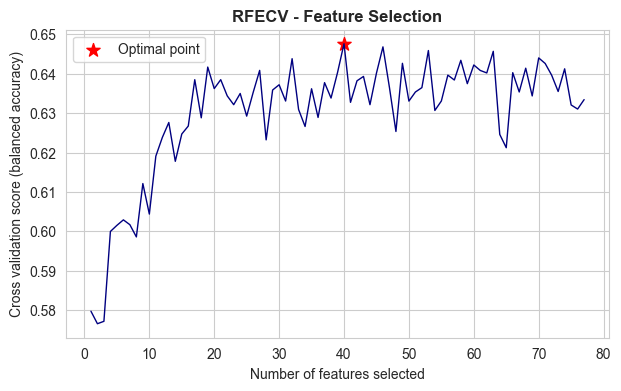

In [26]:
import matplotlib.pyplot as plt

# Assuming `rfecv` is the fitted RFECV object from your previous code

# Extract cross-validation scores from `cv_results_` attribute
cv_scores = rfecv.cv_results_['mean_test_score']

# determine best number of features and best score:
optimal_n_features  = np.argmax(cv_scores) + 1
optimal_score       = np.max(cv_scores)

# Plot
plt.figure(figsize=(7, 4))
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (balanced accuracy)")
# Highlight the point with the highest score
plt.scatter(x=optimal_n_features, y=optimal_score, color='red', s=100, marker='*', label='Optimum')
# Plot number of features VS. cross-validation scores
plt.plot(range(1, len(cv_scores) + 1), cv_scores, color='navy', linewidth=1)

plt.legend()
plt.title("RFECV - Feature Selection", weight='bold')
plt.show()


In [28]:
# Convert the rankings to a Series
feature_rankings = pd.Series(rfecv.ranking_, index=selected_tree_features)

# Filter the selected features to keep only the top n (ranking == 1)
top_n = sum(feature_rankings == 1)

# Sort the rankings and select the top 40 features
top_n_features = feature_rankings.nsmallest(top_n).index.tolist()

# Filter your dataset to keep only the top 40 features
X_train_selected = X_train_alc[top_n_features]
X_test_selected = X_test_alc[top_n_features]  # Assuming you have a similar test dataset

# Display which features were selected
print(f"# features selected: {len(top_n_features)}")
print(f"Features: {top_n_features}")

# features selected: 40
Features: ['Analytic', 'Clout', 'Authentic', 'Tone', 'Dic', 'pronoun', 'ppron', 'i', 'shehe', 'adverb', 'conj', 'negate', 'number', 'affect', 'negemo', 'anger', 'sad', 'female', 'certain', 'see', 'hear', 'body', 'health', 'ingest', 'risk', 'focuspresent', 'relativ', 'space', 'time', 'work', 'money', 'death', 'swear', 'netspeak', 'nonflu', 'AllPunc', 'Period', 'Quote', 'Parenth', 'OtherP']


In [29]:
# refit with top 40
model = XGBClassifier(
                n_estimators     = 186, #study.best_trial.params['n_estimators'],
                max_depth        = 6, #study.best_trial.params['max_depth'],
                min_child_weight = 6, #study.best_trial.params['min_child_weight'],
                subsample        = 0.18465100138394708, #study.best_trial.params['subsample'],
                colsample_bytree = 0.48440775337725545, #study.best_trial.params['colsample_bytree'],
                learning_rate    = 0.009729767944171503, #study.best_trial.params['learning_rate'],
                reg_alpha        = 0.04329879689185605, #study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# initialize RFECV
model.fit(
    X_train_alc[top_n_features],
    y_train_alc
)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.48440775337725545, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.009729767944171503,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=186, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

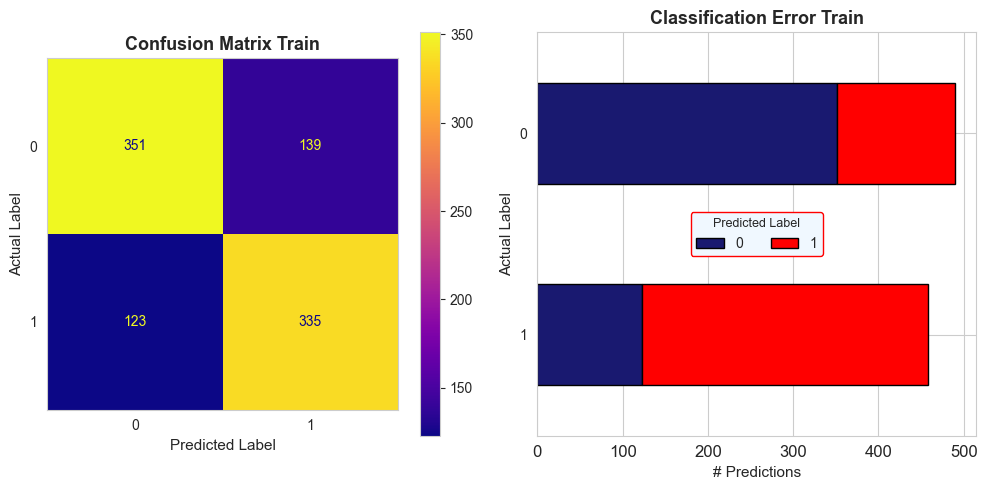

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 490 (52.0%)
- Class 1: 458 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.740506,0.716327,0.728216,490.000000
1,0.706751,0.731441,0.718884,458.000000
accuracy,0.723629,0.723629,0.723629,0.723629
macro avg,0.723629,0.723884,0.723550,948.000000
weighted avg,0.724198,0.723629,0.723707,948.000000


In [30]:
classification_evaluation_report(
    model       = model,
    X           = X_train_alc[top_n_features],
    y           = y_train_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

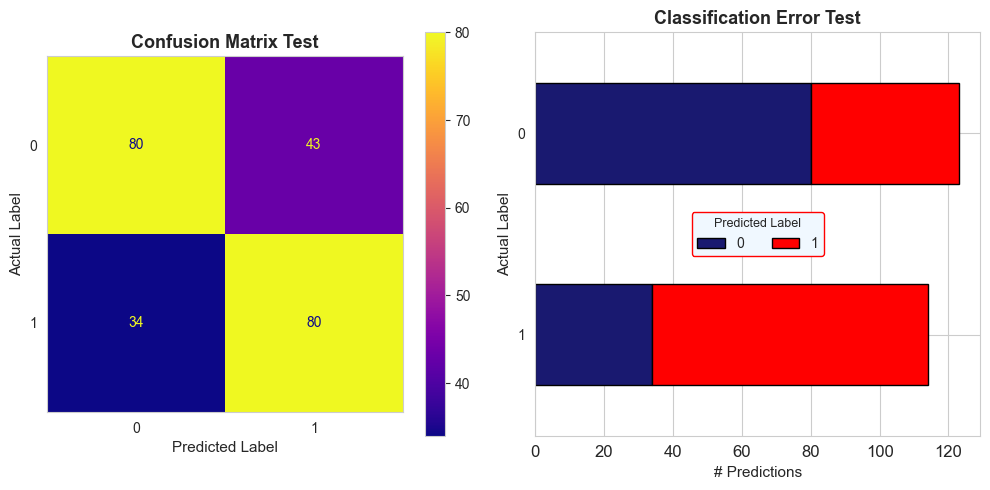

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 123 (52.0%)
- Class 1: 114 (48.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.701754,0.650407,0.675105,123.000000
1,0.650407,0.701754,0.675105,114.000000
accuracy,0.675105,0.675105,0.675105,0.675105
macro avg,0.676080,0.676080,0.675105,237.000000
weighted avg,0.677055,0.675105,0.675105,237.000000


In [31]:
classification_evaluation_report(
    model       = model,
    X           = X_test_alc[top_n_features],
    y           = y_test_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Shap:

/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/xgboost/core.py:160: UserWarning:

[13:08:52] WARNING: /Users/runner/work/xgboost/xgboost/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



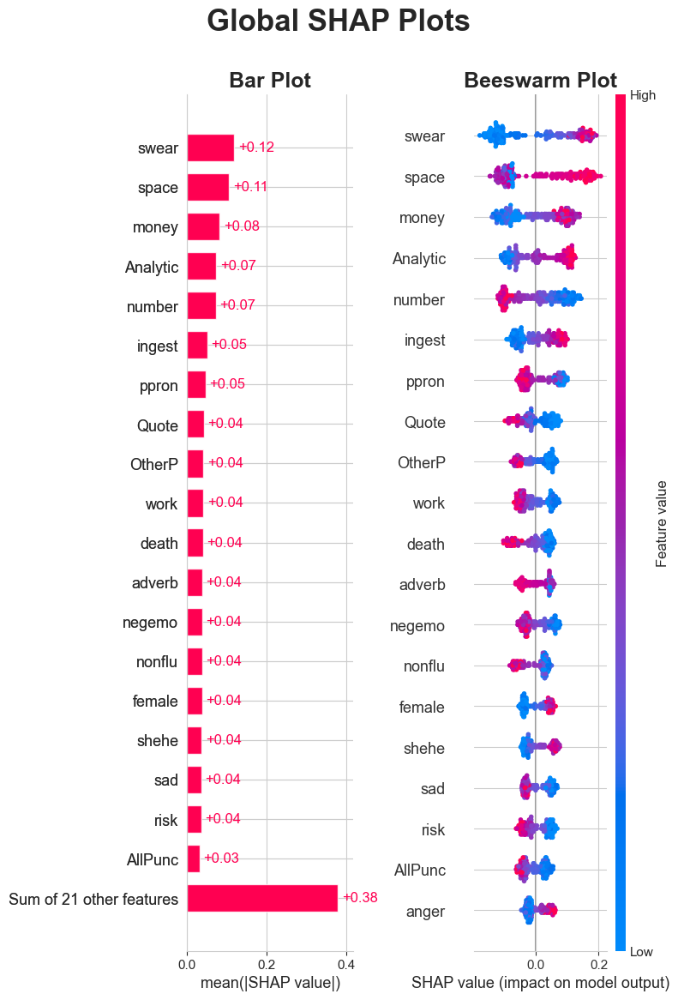

In [32]:
global_shap_plots_tree(
    model    = model,
    X        = X_test_alc[top_n_features],
    figsize  = (20, 10),
    max_display=20
)

#### 4.1.4) Research Parameter Space
- Optimize:

In [33]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 100, 199)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.01, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.0001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_alc,
                    eval_metric      = 'logloss'
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_alc[top_n_features],
                        y         = y_train_alc,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=99, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-29 13:10:20,952] A new study created in memory with name: no-name-de4d42d6-4088-4490-a2aa-a71ce4cdbe7a
[I 2023-12-29 13:10:21,474] Trial 0 finished with value: 0.5912111801242237 and parameters: {'n_estimators': 149, 'max_depth': 2, 'min_child_weight': 8, 'subsample': 0.2595594716296433, 'colsample_bytree': 0.04281713695817566, 'learning_rate': 0.0027893231678790633, 'reg_alpha': 0.010437909905621757}. Best is trial 0 with value: 0.5912111801242237.
[I 2023-12-29 13:10:21,769] Trial 1 finished with value: 0.6075234151631668 and parameters: {'n_estimators': 117, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.7013741128795007, 'colsample_bytree': 0.0523662990663375, 'learning_rate': 0.11957214871456975, 'reg_alpha': 0.0002042323991287424}. Best is trial 1 with value: 0.6075234151631668.
[I 2023-12-29 13:10:22,195] Trial 2 finished with value: 0.5760844917677217 and parameters: {'n_estimators': 155, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.11970553116183505,

___________________________________________________________________________________________________
Best trial: {'n_estimators': 158, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.2407737661850762, 'colsample_bytree': 0.32518117286834664, 'learning_rate': 0.0017296986180991966, 'reg_alpha': 1.2491456321192092e-05}


- Refit with best selected parameters:

    - `Best trial:` {'n_estimators': 185, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.18895001763045383, 'colsample_bytree': 0.37733673962112935, 'learning_rate': 0.017148355051919025, 'reg_alpha': 0.11094832058135827}
    - `better`: {'n_estimators': 158, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.2407737661850762, 'colsample_bytree': 0.32518117286834664, 'learning_rate': 0.0017296986180991966, 'reg_alpha': 1.2491456321192092e-05} `>>> OPTIMUM <<<`


In [34]:
best_params = study.best_trial.params

model = XGBClassifier(
                n_estimators     = best_params['n_estimators'],
                max_depth        = best_params['max_depth'],
                min_child_weight = best_params['min_child_weight'],
                subsample        = best_params['subsample'],
                colsample_bytree = best_params['colsample_bytree'],
                learning_rate    = best_params['learning_rate'],
                reg_alpha        = best_params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# fit model on training data
model.fit(
    X_train_alc[top_n_features],
    y_train_alc
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.32518117286834664, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0017296986180991966,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=158, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate:

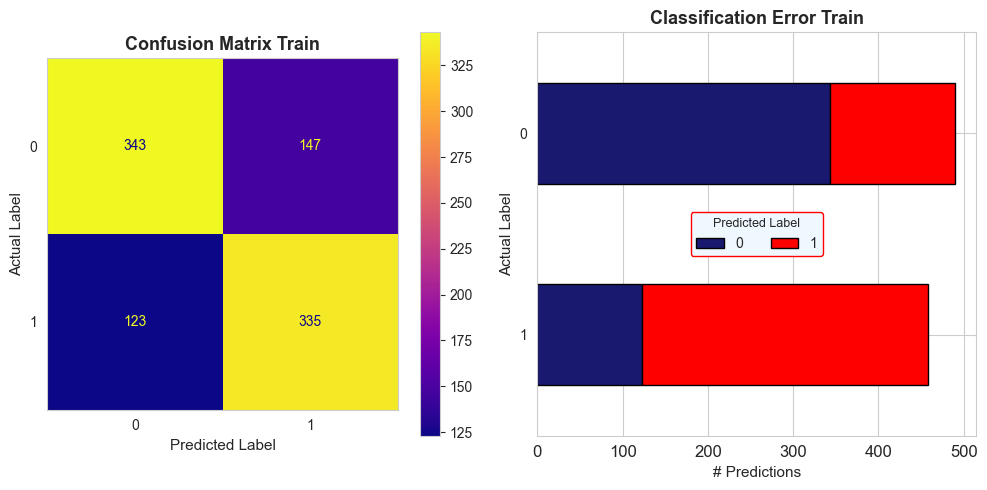

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 490 (52.0%)
- Class 1: 458 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.736052,0.700000,0.717573,490.000000
1,0.695021,0.731441,0.712766,458.000000
accuracy,0.715190,0.715190,0.715190,0.715190
macro avg,0.715536,0.715721,0.715170,948.000000
weighted avg,0.716229,0.715190,0.715251,948.000000


In [37]:
classification_evaluation_report(
    model       = model,
    X           = X_train_alc[top_n_features],
    y           = y_train_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

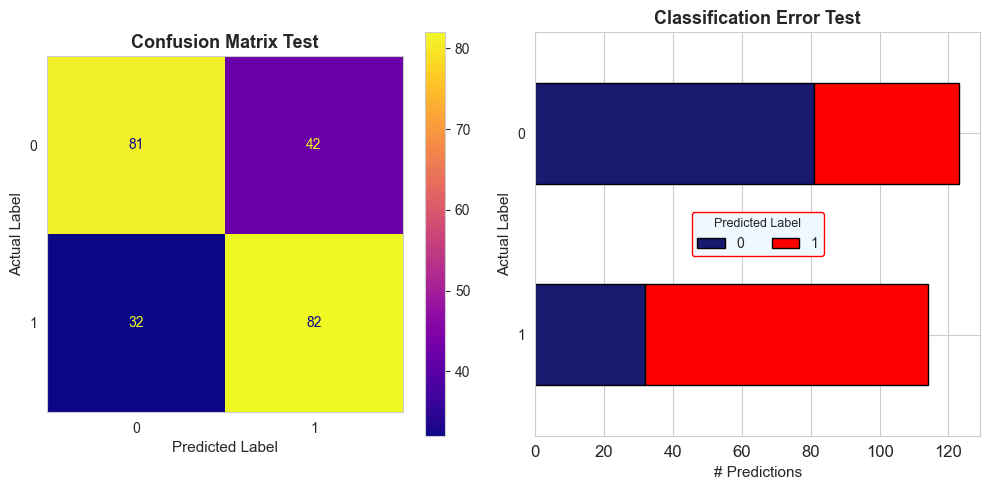

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 123 (52.0%)
- Class 1: 114 (48.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.716814,0.658537,0.686441,123.000000
1,0.661290,0.719298,0.689076,114.000000
accuracy,0.687764,0.687764,0.687764,0.687764
macro avg,0.689052,0.688917,0.687758,237.000000
weighted avg,0.690106,0.687764,0.687708,237.000000


In [38]:
classification_evaluation_report(
    model       = model,
    X           = X_test_alc[top_n_features],
    y           = y_test_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

#### 4.1.5) ANOVA Features

In [167]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 122, 199)
    max_depth        = trial.suggest_int("max_depth", 2, 4)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.01, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.0001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_alc,
                    eval_metric      = 'logloss'
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    #bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # roc_auc scorer
    roc_auc_scorer = make_scorer(roc_auc_score, needs_proba=True)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_alc[alcohol_anova_features],
                        y         = y_train_alc,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = roc_auc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-29 20:50:24,918] A new study created in memory with name: no-name-6df5445c-152d-4fcd-aa74-0f743fa886d9
[I 2023-12-29 20:50:29,667] Trial 0 finished with value: 0.6308912550527458 and parameters: {'n_estimators': 147, 'max_depth': 2, 'min_child_weight': 8, 'subsample': 0.6769704762517487, 'colsample_bytree': 0.007904959731916558, 'learning_rate': 0.004060628561770354, 'reg_alpha': 0.00018024834875809064}. Best is trial 0 with value: 0.6308912550527458.
[I 2023-12-29 20:50:29,920] Trial 1 finished with value: 0.6335433303756286 and parameters: {'n_estimators': 123, 'max_depth': 2, 'min_child_weight': 3, 'subsample': 0.44059597872279493, 'colsample_bytree': 0.0035542546769675577, 'learning_rate': 0.06803651214243513, 'reg_alpha': 4.740157222828381e-06}. Best is trial 1 with value: 0.6335433303756286.
[I 2023-12-29 20:50:30,184] Trial 2 finished with value: 0.6333875579217195 and parameters: {'n_estimators': 152, 'max_depth': 2, 'min_child_weight': 4, 'subsample': 0.459068621114

___________________________________________________________________________________________________
Best trial: {'n_estimators': 158, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.3280478571623395, 'colsample_bytree': 0.582201904344626, 'learning_rate': 0.010885380349306679, 'reg_alpha': 0.31109240011905603}


- Refit:

In [169]:
best_params = study.best_trial.params

model = XGBClassifier(
                n_estimators     = best_params['n_estimators'],
                max_depth        = best_params['max_depth'],
                min_child_weight = best_params['min_child_weight'],
                subsample        = best_params['subsample'],
                colsample_bytree = best_params['colsample_bytree'],
                learning_rate    = best_params['learning_rate'],
                reg_alpha        = best_params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# fit model on training data
model.fit(
    X_train_alc[alcohol_anova_features],
    y_train_alc
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.582201904344626, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.010885380349306679,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=158, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate:

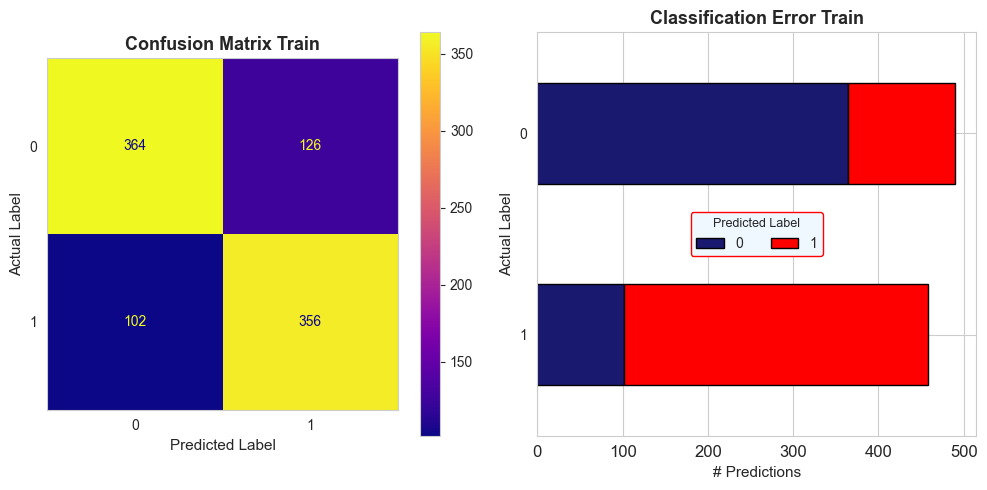

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 490 (52.0%)
- Class 1: 458 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.781116,0.742857,0.761506,490.000000
1,0.738589,0.777293,0.757447,458.000000
accuracy,0.759494,0.759494,0.759494,0.759494
macro avg,0.759853,0.760075,0.759477,948.000000
weighted avg,0.760570,0.759494,0.759545,948.000000


In [170]:
classification_evaluation_report(
    model       = model,
    X           = X_train_alc[alcohol_anova_features],
    y           = y_train_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

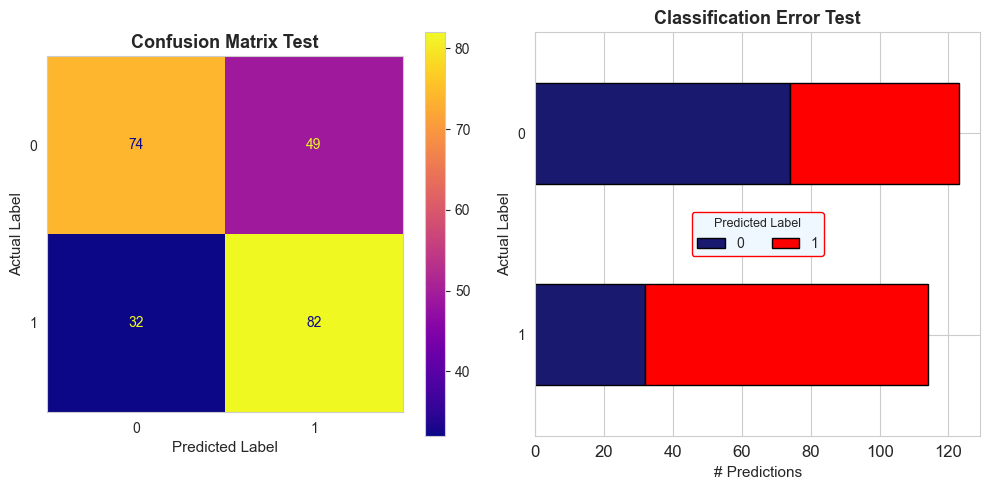

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 123 (52.0%)
- Class 1: 114 (48.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.698113,0.601626,0.646288,123.000000
1,0.625954,0.719298,0.669388,114.000000
accuracy,0.658228,0.658228,0.658228,0.658228
macro avg,0.662034,0.660462,0.657838,237.000000
weighted avg,0.663404,0.658228,0.657399,237.000000


In [171]:
classification_evaluation_report(
    model       = model,
    X           = X_test_alc[alcohol_anova_features],
    y           = y_test_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Recursively Eliminate:

In [172]:
# rfe
from sklearn.feature_selection import RFECV

# initialize XGBoost model with best parameters

model = XGBClassifier(
                n_estimators     = best_params['n_estimators'],
                max_depth        = best_params['max_depth'],
                min_child_weight = best_params['min_child_weight'],
                subsample        = best_params['subsample'],
                colsample_bytree = best_params['colsample_bytree'],
                learning_rate    = best_params['learning_rate'],
                reg_alpha        = best_params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# initialize RFECV
rfecv = RFECV(
            estimator = model,
            step      = 1,
            cv        = StratifiedKFold(n_splits=10, shuffle=True, random_state=42),
            scoring   = 'roc_auc',
            n_jobs    = -1
)

# fit RFECV on training data
rfecv.fit(X_train_alc[alcohol_anova_features], y_train_alc)

RFECV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
      estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=0.582201904344626, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric='logloss',
                              feature_types=None, gamma=None, grow_policy=None,
                              im...
                              interaction_constraints=None,
                              learning_rate=0.010885380349306679, max_bin=None,
                              max_cat_threshold=None, max_cat_to_onehot=None,
                              max_delta_step=None, max_depth=3, max_leaves=None,
                              min_child_weight=7, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=158, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...),
      n_jobs=-1, scoring='roc_auc')

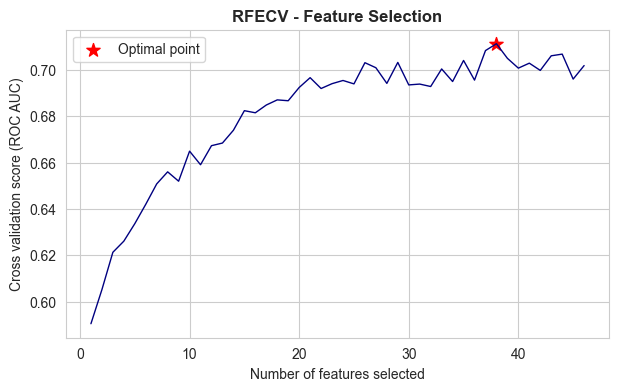

In [173]:
# Extract cross-validation scores from `cv_results_` attribute
cv_scores = rfecv.cv_results_['mean_test_score']

# determine best number of features and best score:
optimal_n_features  = np.argmax(cv_scores) + 1
optimal_score       = np.max(cv_scores)

# Plot
plt.figure(figsize=(7, 4))
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (ROC AUC)")
# Highlight the point with the highest score
plt.scatter(optimal_n_features, optimal_score, color='red', s=100, marker='*', label='Optimal point')
# Plot number of features VS. cross-validation scores
plt.plot(range(1, len(cv_scores) + 1), cv_scores, color='navy', linewidth=1)

plt.legend()
plt.title("RFECV - Feature Selection", weight='bold')
plt.show()

In [174]:
# Convert the rankings to a Series
feature_rankings = pd.Series(rfecv.ranking_, index=alcohol_anova_features)

# Filter the selected features to keep only the top n (ranking == 1)
top_n = sum(feature_rankings == 1)

# Sort the rankings and select the top 40 features
top_n_features = feature_rankings.nsmallest(top_n).index.tolist()

# Filter your dataset to keep only the top 40 features
X_train_selected = X_train_alc[top_n_features]
X_test_selected = X_test_alc[top_n_features]  # Assuming you have a similar test dataset

# Display which features were selected
print(f"# features selected: {len(top_n_features)}")
print(f"Features: {top_n_features}")

# features selected: 38
Features: ['Analytic', 'i', 'number', 'adverb', 'Colon', 'assent', 'money', 'ppron', 'space', 'OtherP', 'sexual', 'prep', 'bio', 'focuspast', 'anx', 'swear', 'hear', 'ingest', 'nonflu', 'Authentic', 'cause', 'AllPunc', 'risk', 'work', 'interrog', 'percept', 'negemo', 'Quote', 'see', 'article', 'death', 'they', 'Clout', 'we', 'sad', 'Sixltr', 'netspeak', 'shehe']


- Re-optimize with top n:

In [175]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 22, 70)
    max_depth        = trial.suggest_int("max_depth", 2, 4)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.01, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.0001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_alc,
                    eval_metric      = 'logloss'
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    #bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # roc_auc scorer
    roc_auc_scorer = make_scorer(roc_auc_score, needs_proba=True)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_alc[top_n_features],
                        y         = y_train_alc,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = roc_auc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-29 20:53:13,372] A new study created in memory with name: no-name-ad3bb076-4e1b-4f82-85ea-d49994c7dfc5


[I 2023-12-29 20:53:13,557] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 27, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.022497774330560452, 'colsample_bytree': 0.06750556135098651, 'learning_rate': 0.2564025597837446, 'reg_alpha': 0.014461417759322314}. Best is trial 0 with value: 0.5.
[I 2023-12-29 20:53:13,739] Trial 1 finished with value: 0.6543685300207039 and parameters: {'n_estimators': 46, 'max_depth': 2, 'min_child_weight': 4, 'subsample': 0.04689199423401168, 'colsample_bytree': 0.9126738036755034, 'learning_rate': 0.02016841892226809, 'reg_alpha': 1.167465793110922e-05}. Best is trial 1 with value: 0.6543685300207039.
[I 2023-12-29 20:53:13,949] Trial 2 finished with value: 0.6393813467415951 and parameters: {'n_estimators': 67, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.3227435773271393, 'colsample_bytree': 0.010096585128315337, 'learning_rate': 0.00038857427451980374, 'reg_alpha': 5.04086797913971e-05}. Best is trial 1 with value: 

___________________________________________________________________________________________________
Best trial: {'n_estimators': 66, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.17996175990588018, 'colsample_bytree': 0.001794202268024576, 'learning_rate': 0.014117458067338851, 'reg_alpha': 1.785157833246844e-05}


- Refit with top n:

In [176]:
model = XGBClassifier(
                n_estimators     = best_params['n_estimators'],
                max_depth        = best_params['max_depth'],
                min_child_weight = best_params['min_child_weight'],
                subsample        = best_params['subsample'],
                colsample_bytree = best_params['colsample_bytree'],
                learning_rate    = best_params['learning_rate'],
                reg_alpha        = best_params['reg_alpha'],
                scale_pos_weight = weight_alc,
                eval_metric      = 'logloss'
)

# fit model on training data
model.fit(
    X_train_alc[top_n_features],
    y_train_alc
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.582201904344626, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.010885380349306679,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=158, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

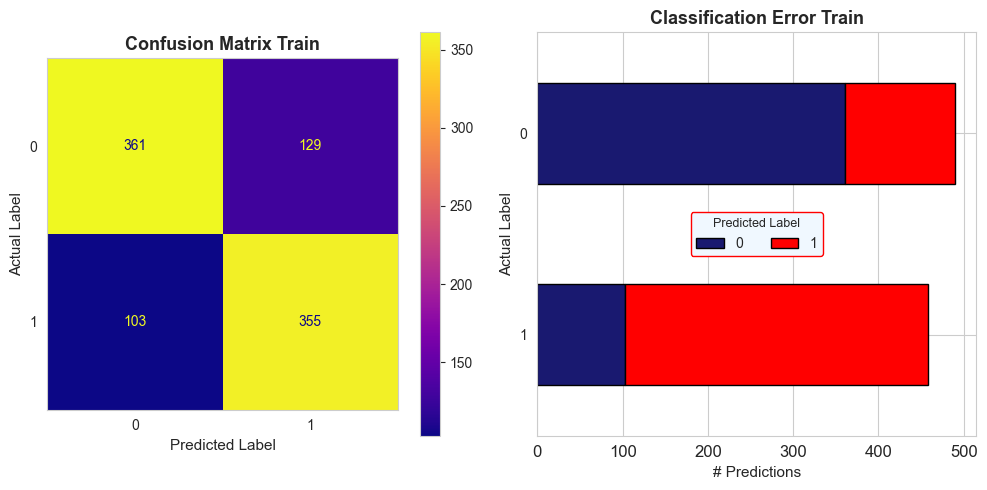

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 490 (52.0%)
- Class 1: 458 (48.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.778017,0.736735,0.756813,490.000000
1,0.733471,0.775109,0.753715,458.000000
accuracy,0.755274,0.755274,0.755274,0.755274
macro avg,0.755744,0.755922,0.755264,948.000000
weighted avg,0.756496,0.755274,0.755317,948.000000


In [177]:
classification_evaluation_report(
    model       = model,
    X           = X_train_alc[top_n_features],
    y           = y_train_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

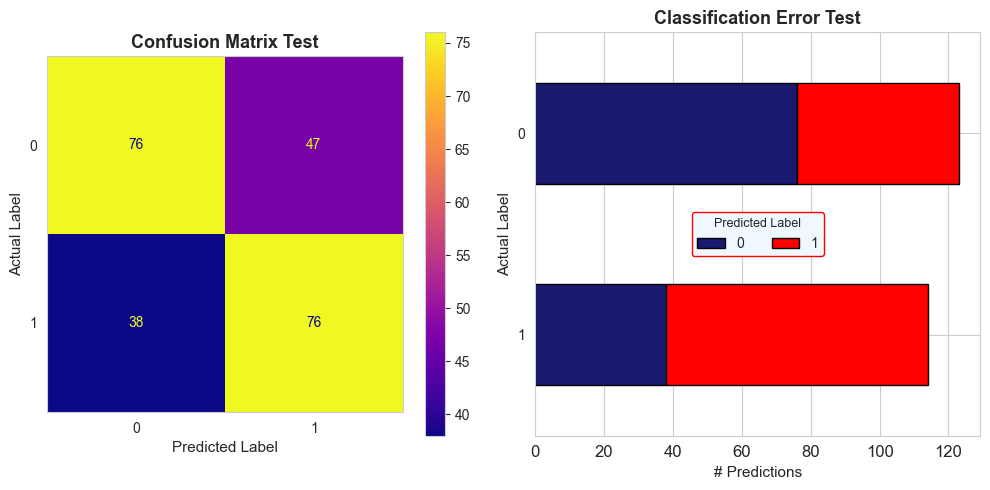

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 123 (52.0%)
- Class 1: 114 (48.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.666667,0.617886,0.641350,123.000000
1,0.617886,0.666667,0.641350,114.000000
accuracy,0.641350,0.641350,0.641350,0.641350
macro avg,0.642276,0.642276,0.641350,237.000000
weighted avg,0.643203,0.641350,0.641350,237.000000


In [178]:
classification_evaluation_report(
    model       = model,
    X           = X_test_alc[top_n_features],
    y           = y_test_alc,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

### 4.2) Feedforward Net:

In [167]:
# feed forward net:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# define model
ffnn = keras.Sequential([
    #layers.Dense(64, activation='relu', input_shape=[len(X_train_alc.columns)]),
    #layers.Dropout(0.2),
    #layers.Dense(32, activation='relu'),
    #layers.Dropout(0.2),
    #layers.Dense(16, activation='relu'),
    #layers.Dropout(0.15),
    layers.Dense(8, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(4, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(3, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

ffnn.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = ffnn .fit(
    X_train_alc,
    y_train_alc,
    epochs=150,
    batch_size=32,
    verbose=1,
    validation_split=0.1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ModelCheckpoint(
            filepath='models/ffn_alc.h5',
            monitor='val_loss',
            save_best_only=True
        )
    ]
)

Epoch 1/150
27/27 [==============================] - 1s 11ms/step - loss: 27.7076 - accuracy: 0.4865 - val_loss: 28.4936 - val_accuracy: 0.4526
Epoch 2/150
27/27 [==============================] - 0s 3ms/step - loss: 17.0129 - accuracy: 0.4982 - val_loss: 10.9917 - val_accuracy: 0.4737
Epoch 3/150
24/27 [=========================>....] - ETA: 0s - loss: 7.7317 - accuracy: 0.5130

/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



27/27 [==============================] - 0s 4ms/step - loss: 7.6216 - accuracy: 0.5147 - val_loss: 1.8931 - val_accuracy: 0.5263
Epoch 4/150
27/27 [==============================] - 0s 7ms/step - loss: 5.1303 - accuracy: 0.4982 - val_loss: 1.1524 - val_accuracy: 0.4947
Epoch 5/150
27/27 [==============================] - 0s 3ms/step - loss: 2.3607 - accuracy: 0.4994 - val_loss: 0.8966 - val_accuracy: 0.4947
Epoch 6/150
27/27 [==============================] - 0s 3ms/step - loss: 2.3325 - accuracy: 0.5111 - val_loss: 0.7470 - val_accuracy: 0.4421
Epoch 7/150
27/27 [==============================] - 0s 3ms/step - loss: 1.5156 - accuracy: 0.5041 - val_loss: 0.7249 - val_accuracy: 0.4421
Epoch 8/150
27/27 [==============================] - 0s 3ms/step - loss: 1.8703 - accuracy: 0.5029 - val_loss: 0.6966 - val_accuracy: 0.4842
Epoch 9/150
27/27 [==============================] - 0s 3ms/step - loss: 1.7746 - accuracy: 0.4877 - val_loss: 0.6835 - val_accuracy: 0.5474
Epoch 10/150
27/27 [=====

- Learning Curves:

Text(0, 0.5, 'Accuracy')

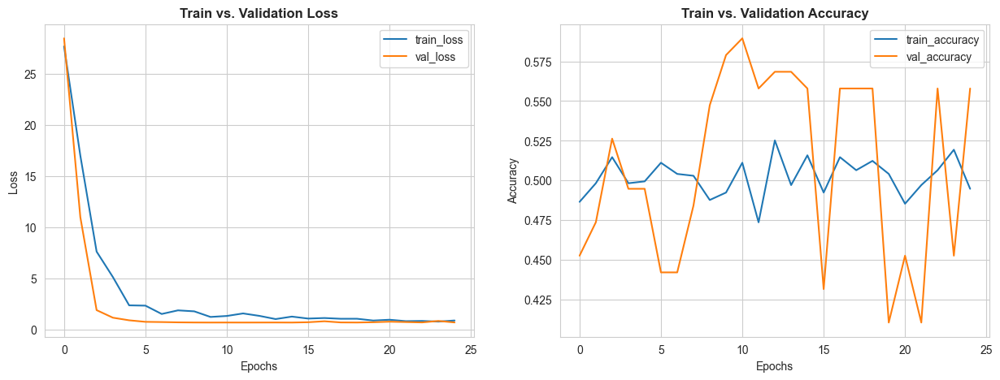

In [168]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# loss
sns.lineplot(x=history.epoch, y=history.history['loss'], ax=ax[0], label='train_loss')
sns.lineplot(x=history.epoch, y=history.history['val_loss'], ax=ax[0], label='val_loss')
ax[0].set_title("Train vs. Validation Loss", weight='bold')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")

# accuracy
sns.lineplot(x=history.epoch, y=history.history['accuracy'], ax=ax[1], label='train_accuracy')
sns.lineplot(x=history.epoch, y=history.history['val_accuracy'], ax=ax[1], label='val_accuracy')
ax[1].set_title("Train vs. Validation Accuracy", weight='bold')
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")

## **5) Target Drugs**
---

### 5.1) XGBoost

#### 5.1.1) Baseline with all features

- Optimization:

In [42]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 299)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_drugs,
                    eval_metric      = 'logloss'
    )

    # F1 scorer for cross-validation
    f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_drug,
                        y         = y_train_drug,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=99, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-30 10:56:26,991] A new study created in memory with name: no-name-ff47080e-4905-47d3-9b7a-0be2539f4d99


[I 2023-12-30 10:56:27,652] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 217, 'max_depth': 9, 'min_child_weight': 2, 'subsample': 0.0020813638528349838, 'colsample_bytree': 0.001720074646098253, 'learning_rate': 0.26982727094924713, 'reg_alpha': 1.4706940578542745e-06}. Best is trial 0 with value: 0.5.
[I 2023-12-30 10:56:28,359] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 210, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.0012246525705854495, 'colsample_bytree': 0.0017261051282018538, 'learning_rate': 0.00636148338447079, 'reg_alpha': 1.593090312133374e-06}. Best is trial 0 with value: 0.5.
[I 2023-12-30 10:56:28,935] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 276, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.004085084347199178, 'colsample_bytree': 0.2390530881944706, 'learning_rate': 0.0014833383955692577, 'reg_alpha': 0.0001682078879376235}. Best is trial 0 with value: 0.5.
[I 2023-12-30 10:56:29,395]

___________________________________________________________________________________________________
Best trial: {'n_estimators': 63, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.6142215772751753, 'colsample_bytree': 0.5338027874394076, 'learning_rate': 0.006985895082978202, 'reg_alpha': 0.0007645308348476804}


- Refit model with best parameters:

  - Best trial: {'n_estimators': 71, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9898880977109515, 'colsample_bytree': 0.1655069684699584, 'learning_rate': 0.018565519880099052, 'reg_alpha': 0.013855835366845903}


In [43]:
model = XGBClassifier(
                n_estimators     = study.best_trial.params['n_estimators'],
                max_depth        = study.best_trial.params['max_depth'],
                min_child_weight = study.best_trial.params['min_child_weight'],
                subsample        = study.best_trial.params['subsample'],
                colsample_bytree = study.best_trial.params['colsample_bytree'],
                learning_rate    = study.best_trial.params['learning_rate'],
                reg_alpha        = study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_drugs,
                eval_metric      = 'logloss'
)

model.fit(
    X_train_drug,
    y_train_drug
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5338027874394076, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.006985895082978202,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=9, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=63, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate:

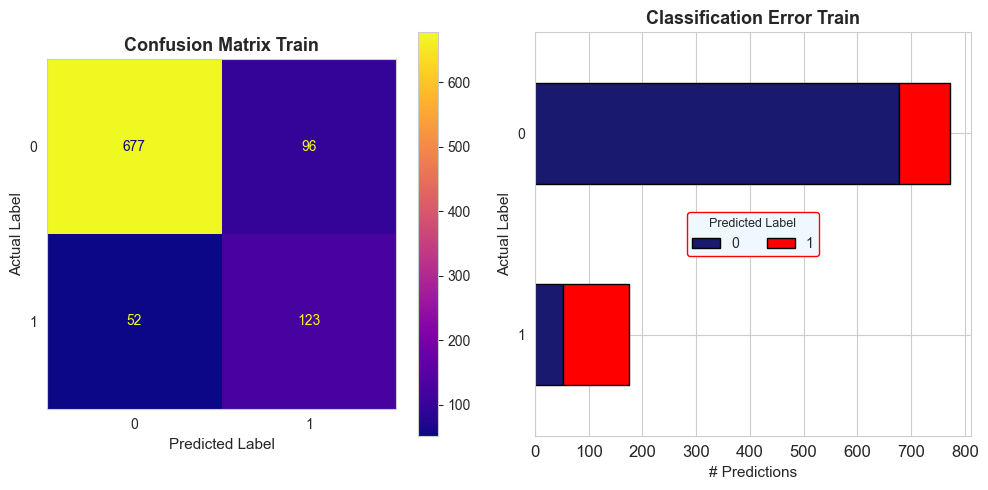

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 773 (82.0%)
- Class 1: 175 (18.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.928669,0.875809,0.901465,773.000000
1,0.561644,0.702857,0.624365,175.000000
accuracy,0.843882,0.843882,0.843882,0.843882
macro avg,0.745157,0.789333,0.762915,948.000000
weighted avg,0.860917,0.843882,0.850312,948.000000


In [44]:
classification_evaluation_report(
    model       = model,
    X           = X_train_drug,
    y           = y_train_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

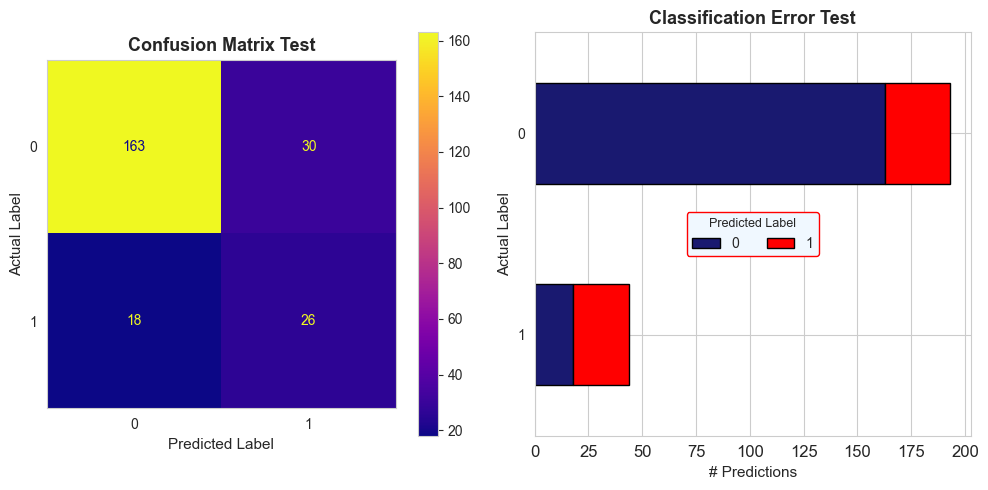

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 193 (81.0%)
- Class 1: 44 (19.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.900552,0.844560,0.871658,193.000000
1,0.464286,0.590909,0.520000,44.000000
accuracy,0.797468,0.797468,0.797468,0.797468
macro avg,0.682419,0.717734,0.695829,237.000000
weighted avg,0.819558,0.797468,0.806371,237.000000


In [45]:
classification_evaluation_report(
    model       = model,
    X           = X_test_drug,
    y           = y_test_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Feature Importance Plot:

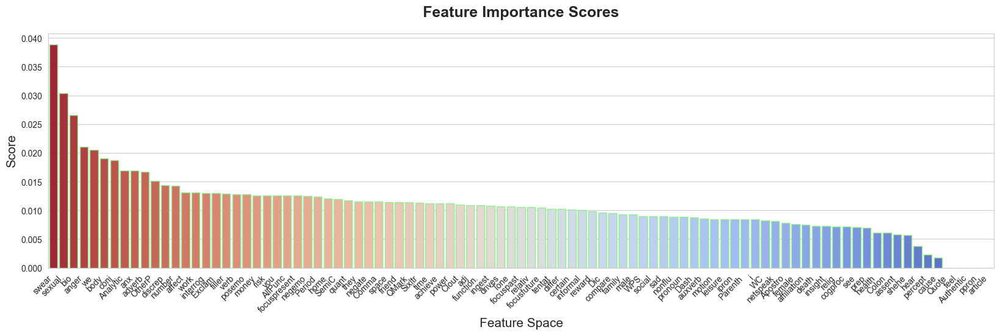

In [76]:
feature_importance_plot(
    model          = model,
    feature_names  = liwc,
    figsize         = (20, 5),
    horizontal     = False
)

- Select features:

In [77]:
# threshold for feature importance
threshold = float(input("Enter the threshold for feature importance: ")) # 0.015

# select features with importance above threshold
selected_tree_features = [f for f, s in zip(liwc, model.feature_importances_) if s >= threshold]
print(f"Threshold: {threshold}")
print(f"# features selected: {len(selected_tree_features)}")
print(f"Selected features: {selected_tree_features}")

Threshold: 0.015
# features selected: 11
Selected features: ['Analytic', 'we', 'adverb', 'conj', 'anx', 'anger', 'bio', 'body', 'sexual', 'swear', 'OtherP']


#### 5.1.2) Retrain Model with Model-based-features

- Optimization

In [78]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 299)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_drugs,
                    eval_metric      = 'logloss'
    )

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_drug[selected_tree_features],
                        y         = y_train_drug,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=99, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-03 13:24:30,442] A new study created in memory with name: no-name-ccf91d09-6f3d-40bd-8d84-b4c098f98ce1
[I 2023-12-03 13:24:30,718] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 113, 'max_depth': 5, 'min_child_weight': 8, 'subsample': 0.010062366951314818, 'colsample_bytree': 0.8818359035215442, 'learning_rate': 0.26240606319660603, 'reg_alpha': 0.06894242183849686}. Best is trial 0 with value: 0.5.
[I 2023-12-03 13:24:30,944] Trial 1 finished with value: 0.6379448982390159 and parameters: {'n_estimators': 226, 'max_depth': 2, 'min_child_weight': 1, 'subsample': 0.37247786267200583, 'colsample_bytree': 0.011864091400002722, 'learning_rate': 0.003417368523410594, 'reg_alpha': 0.00012688518369032738}. Best is trial 1 with value: 0.6379448982390159.
[I 2023-12-03 13:24:31,121] Trial 2 finished with value: 0.6354284604284605 and parameters: {'n_estimators': 202, 'max_depth': 5, 'min_child_weight': 9, 'subsample': 0.054105339514015305, 'colsample_bytree': 0.062

___________________________________________________________________________________________________
Best trial: {'n_estimators': 192, 'max_depth': 2, 'min_child_weight': 3, 'subsample': 0.327253090935289, 'colsample_bytree': 0.7206542397985745, 'learning_rate': 0.003874930227142295, 'reg_alpha': 0.0059973651290743}


- Refit model with best parameters:
  - Best trial: {'n_estimators': 192, 'max_depth': 2, 'min_child_weight': 3, 'subsample': 0.327253090935289, 'colsample_bytree': 0.7206542397985745, 'learning_rate': 0.003874930227142295, 'reg_alpha': 0.0059973651290743}


In [79]:
model = XGBClassifier(
                n_estimators     = study.best_trial.params['n_estimators'],
                max_depth        = study.best_trial.params['max_depth'],
                min_child_weight = study.best_trial.params['min_child_weight'],
                subsample        = study.best_trial.params['subsample'],
                colsample_bytree = study.best_trial.params['colsample_bytree'],
                learning_rate    = study.best_trial.params['learning_rate'],
                reg_alpha        = study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_drugs,
                eval_metric      = 'logloss'
)

model.fit(
    X_train_drug[selected_tree_features],
    y_train_drug
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7206542397985745, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.003874930227142295,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=192, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate:

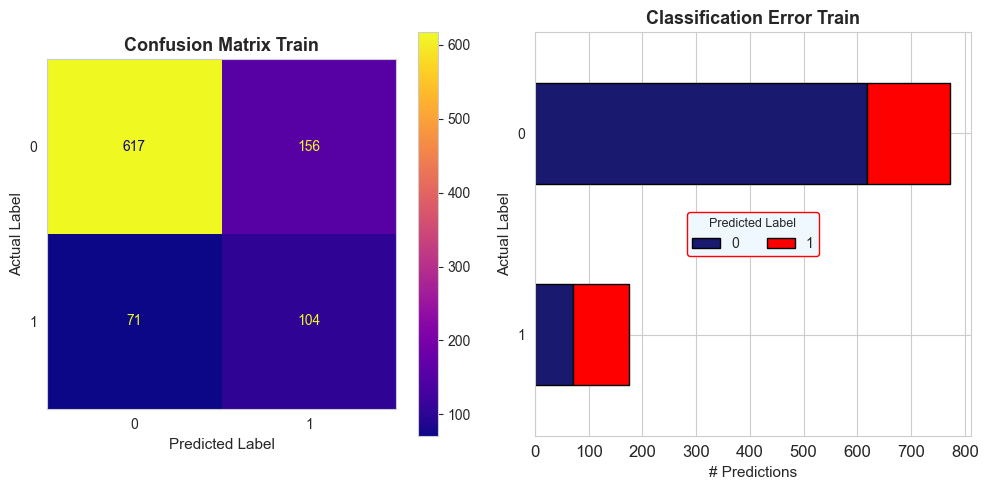

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 773 (82.0%)
- Class 1: 175 (18.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.896802,0.798189,0.844627,773.000000
1,0.400000,0.594286,0.478161,175.000000
accuracy,0.760549,0.760549,0.760549,0.760549
macro avg,0.648401,0.696237,0.661394,948.000000
weighted avg,0.805093,0.760549,0.776978,948.000000


In [80]:
classification_evaluation_report(
    model       = model,
    X           = X_train_drug[selected_tree_features],
    y           = y_train_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

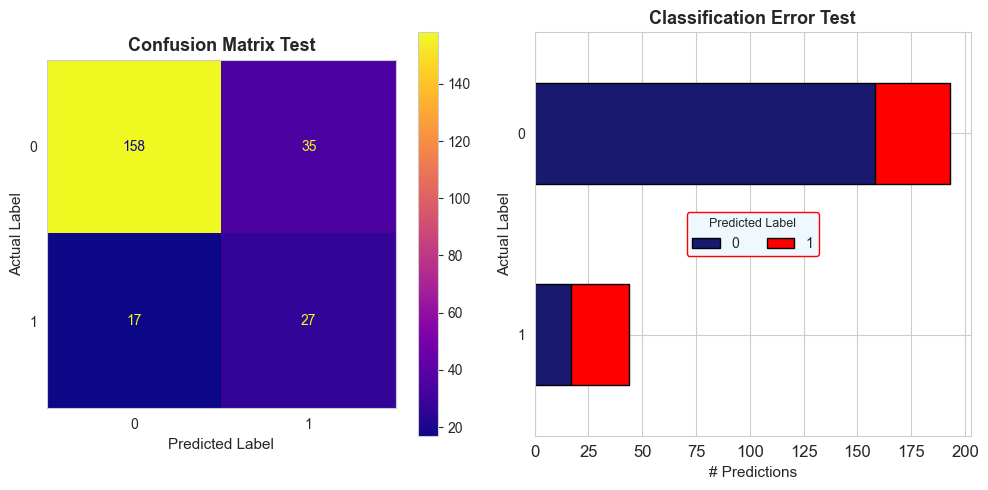

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 193 (81.0%)
- Class 1: 44 (19.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.902857,0.818653,0.858696,193.000000
1,0.435484,0.613636,0.509434,44.000000
accuracy,0.780591,0.780591,0.780591,0.780591
macro avg,0.669171,0.716145,0.684065,237.000000
weighted avg,0.816087,0.780591,0.793854,237.000000


In [81]:
classification_evaluation_report(
    model       = model,
    X           = X_test_drug[selected_tree_features],
    y           = y_test_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

#### 5.1.1) ANOVA features

In [180]:
def objective(trial):
    # Hyperparameter suggestions
    n_estimators     = trial.suggest_int("n_estimators", 39, 299)
    max_depth        = trial.suggest_int("max_depth", 2, 9)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 9)
    subsample        = trial.suggest_loguniform('subsample', 0.001, 1.0)
    colsample_bytree = trial.suggest_loguniform('colsample_bytree', 0.001, 1.0)
    learning_rate    = trial.suggest_loguniform('learning_rate', 0.001, 0.3)
    reg_alpha        = trial.suggest_loguniform('reg_alpha', 1e-6, 1.0)

    # XGBoost model
    model = XGBClassifier(
                    n_estimators     = n_estimators,
                    max_depth        = max_depth,
                    min_child_weight = min_child_weight,
                    subsample        = subsample,
                    colsample_bytree = colsample_bytree,
                    learning_rate    = learning_rate,
                    reg_alpha        = reg_alpha,
                    scale_pos_weight = weight_drugs,
                    eval_metric      = 'logloss'
    )

    # F1 scorer for cross-validation
    #f1_scorer = make_scorer(f1_score, average='binary')

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with F1 score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_drug[drug_anova_features],
                        y         = y_train_drug,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=99, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-30 09:38:23,969] A new study created in memory with name: no-name-74d90396-aac5-48c5-98c3-e28eb56603c3
[I 2023-12-30 09:38:29,561] Trial 0 finished with value: 0.5848943540120011 and parameters: {'n_estimators': 285, 'max_depth': 8, 'min_child_weight': 6, 'subsample': 0.3454287858321147, 'colsample_bytree': 0.06307381191253246, 'learning_rate': 0.003966283094225957, 'reg_alpha': 5.001677473639279e-06}. Best is trial 0 with value: 0.5848943540120011.
[I 2023-12-30 09:38:29,820] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 286, 'max_depth': 5, 'min_child_weight': 8, 'subsample': 0.004127831471427418, 'colsample_bytree': 0.30709210785365715, 'learning_rate': 0.03834898617971657, 'reg_alpha': 0.00020473500526656973}. Best is trial 0 with value: 0.5848943540120011.
[I 2023-12-30 09:38:30,000] Trial 2 finished with value: 0.5 and parameters: {'n_estimators': 186, 'max_depth': 2, 'min_child_weight': 2, 'subsample': 0.005289176315556868, 'colsample_bytree': 0.01

___________________________________________________________________________________________________
Best trial: {'n_estimators': 253, 'max_depth': 9, 'min_child_weight': 9, 'subsample': 0.27853940011307393, 'colsample_bytree': 0.6400136474493029, 'learning_rate': 0.013163559080885442, 'reg_alpha': 0.015123273290885619}


- Refit:

In [182]:
model = XGBClassifier(
                n_estimators     = study.best_trial.params['n_estimators'],
                max_depth        = study.best_trial.params['max_depth'],
                min_child_weight = study.best_trial.params['min_child_weight'],
                subsample        = study.best_trial.params['subsample'],
                colsample_bytree = study.best_trial.params['colsample_bytree'],
                learning_rate    = study.best_trial.params['learning_rate'],
                reg_alpha        = study.best_trial.params['reg_alpha'],
                scale_pos_weight = weight_drugs,
                eval_metric      = 'logloss'
)

model.fit(
    X_train_drug[drug_anova_features],
    y_train_drug
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6400136474493029, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.013163559080885442,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=9, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=253, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

- Evaluate:

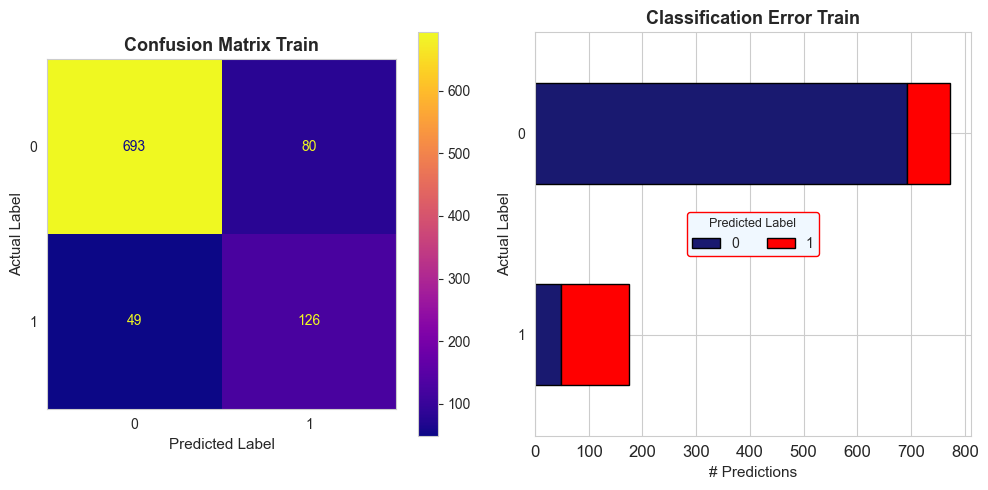

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 773 (82.0%)
- Class 1: 175 (18.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.933962,0.896507,0.914851,773.000000
1,0.611650,0.720000,0.661417,175.000000
accuracy,0.863924,0.863924,0.863924,0.863924
macro avg,0.772806,0.808254,0.788134,948.000000
weighted avg,0.874464,0.863924,0.868068,948.000000


In [183]:
classification_evaluation_report(
    model       = model,
    X           = X_train_drug[drug_anova_features],
    y           = y_train_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

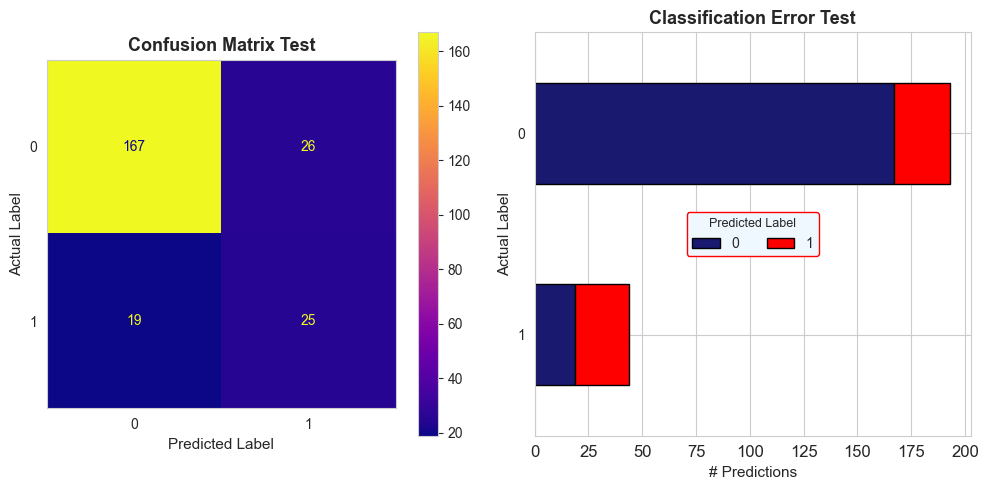

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 193 (81.0%)
- Class 1: 44 (19.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.897849,0.865285,0.881266,193.000000
1,0.490196,0.568182,0.526316,44.000000
accuracy,0.810127,0.810127,0.810127,0.810127
macro avg,0.694023,0.716733,0.703791,237.000000
weighted avg,0.822167,0.810127,0.815368,237.000000


In [184]:
classification_evaluation_report(
    model       = model,
    X           = X_test_drug[drug_anova_features],
    y           = y_test_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

### 5.2) LightGBM

In [ ]:
import lightgbm as lgb

#### 5.2.1) All features:

- Base Model:

In [50]:
lgbm = lgb.LGBMClassifier(objective='binary', metric='binary_logloss', force_col_wise=True, scale_pos_weight=weight_drugs)
lgbm.fit(X_train_drug, y_train_drug)

[LightGBM] [Info] Number of positive: 175, number of negative: 773
[LightGBM] [Info] Total Bins 19456
[LightGBM] [Info] Number of data points in the train set: 948, number of used features: 93
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.184599 -> initscore=-1.485493
[LightGBM] [Info] Start training from score -1.485493


LGBMClassifier(force_col_wise=True, metric='binary_logloss', objective='binary',
               scale_pos_weight=1.07)

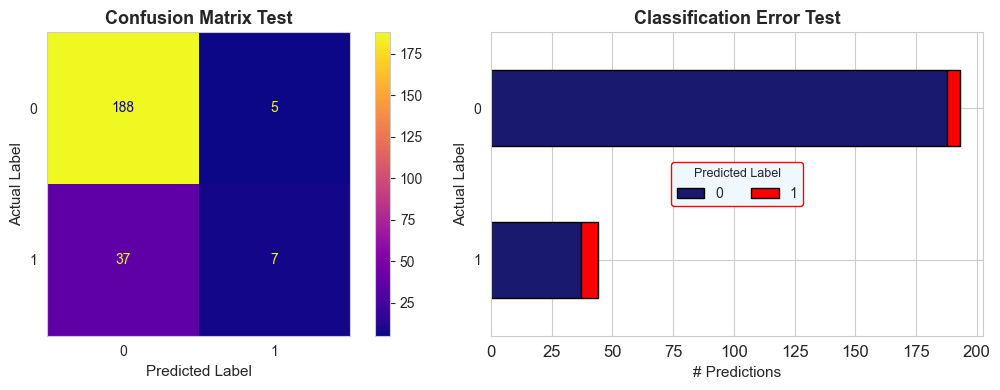

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 193 (81.0%)
- Class 1: 44 (19.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.835556,0.974093,0.899522,193.000000
1,0.583333,0.159091,0.250000,44.000000
accuracy,0.822785,0.822785,0.822785,0.822785
macro avg,0.709444,0.566592,0.574761,237.000000
weighted avg,0.788729,0.822785,0.778935,237.000000


In [51]:
classification_evaluation_report(
    model = lgbm,
    X = X_test_drug,
    y = y_test_drug,
    title_suffix='Test'
)

- Optimize:

In [46]:
def objective(trial):
    # LightGBM model
    model = lgb.LGBMClassifier(
                    num_leaves        = trial.suggest_int("num_leaves", 3, 30),
                    max_depth         = trial.suggest_int("max_depth", 2, 3),
                    learning_rate     = trial.suggest_loguniform("learning_rate", 0.0001, 0.01),
                    n_estimators      = trial.suggest_int("n_estimators", 100, 300),
                    min_child_samples = trial.suggest_int("min_child_samples", 100, 200),
                    subsample         = trial.suggest_uniform("subsample", 0.1, 0.5),
                    colsample_bytree  = trial.suggest_uniform("colsample_bytree", 0.1, 0.5),
                    reg_alpha         = trial.suggest_loguniform("reg_alpha", 1e-8, 10.0),
                    reg_lambda        = trial.suggest_loguniform("reg_lambda", 1e-8, 10.0),
                    objective         = 'binary',
                    metric            = 'binary_logloss',
                    scale_pos_weight  = weight_drugs,
                    boosting_type     = 'gbdt',
                    force_col_wise    = True,
                    verbose           = -1,
                    random_state      = 42
                )

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # Initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with balanced accuracy score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_drug,
                        y         = y_train_drug,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-30 11:00:55,003] A new study created in memory with name: no-name-6a184f6e-dc33-42a0-a180-155da34bc01c


[I 2023-12-30 11:00:55,577] Trial 0 finished with value: 0.5 and parameters: {'num_leaves': 14, 'max_depth': 2, 'learning_rate': 0.00040083946553053654, 'n_estimators': 248, 'min_child_samples': 177, 'subsample': 0.17953138677522046, 'colsample_bytree': 0.10339998575814745, 'reg_alpha': 7.379845651670486e-05, 'reg_lambda': 9.415866013769306e-05}. Best is trial 0 with value: 0.5.
[I 2023-12-30 11:00:56,538] Trial 1 finished with value: 0.5 and parameters: {'num_leaves': 7, 'max_depth': 2, 'learning_rate': 0.0046020249944465665, 'n_estimators': 197, 'min_child_samples': 153, 'subsample': 0.43682225970849287, 'colsample_bytree': 0.13198090338242344, 'reg_alpha': 0.29931844109762606, 'reg_lambda': 4.862542452629311e-06}. Best is trial 0 with value: 0.5.
[I 2023-12-30 11:00:57,021] Trial 2 finished with value: 0.6506122962005315 and parameters: {'num_leaves': 16, 'max_depth': 2, 'learning_rate': 0.008167886557557203, 'n_estimators': 223, 'min_child_samples': 186, 'subsample': 0.483735829521

___________________________________________________________________________________________________
Best trial: {'num_leaves': 3, 'max_depth': 2, 'learning_rate': 0.009418943885371291, 'n_estimators': 299, 'min_child_samples': 197, 'subsample': 0.21463467091929134, 'colsample_bytree': 0.40611829985518844, 'reg_alpha': 0.008100232151330284, 'reg_lambda': 4.011442466548712}


- Refit:

In [47]:
best_params = study.best_trial.params

model = lgb.LGBMClassifier(
                    num_leaves        = best_params['num_leaves'],
                    max_depth         = best_params['max_depth'],
                    learning_rate     = best_params['learning_rate'],
                    n_estimators      = best_params['n_estimators'],
                    min_child_samples = best_params['min_child_samples'],
                    subsample         = best_params['subsample'],
                    colsample_bytree  = best_params['colsample_bytree'],
                    reg_alpha         = best_params['reg_alpha'],
                    reg_lambda        = best_params['reg_lambda'],
                    objective         = 'binary',
                    metric            = 'binary_logloss',
                    boosting_type     = 'gbdt',
                    scale_pos_weight  = weight_drugs,
                    force_col_wise    = True,
                    verbose           = -1,
                    random_state      = 42
)

model.fit(
    X_train_drug,
    y_train_drug
)

LGBMClassifier(colsample_bytree=0.40611829985518844, force_col_wise=True,
               learning_rate=0.009418943885371291, max_depth=2,
               metric='binary_logloss', min_child_samples=197, n_estimators=299,
               num_leaves=3, objective='binary', random_state=42,
               reg_alpha=0.008100232151330284, reg_lambda=4.011442466548712,
               scale_pos_weight=4.42, subsample=0.21463467091929134,
               verbose=-1)

- Evaluate:

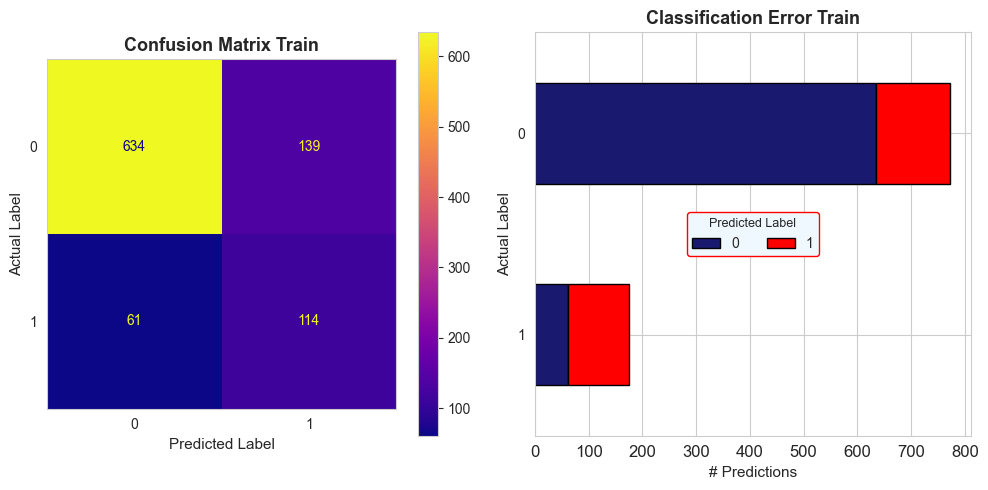

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 773 (82.0%)
- Class 1: 175 (18.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.912230,0.820181,0.863760,773.000000
1,0.450593,0.651429,0.532710,175.000000
accuracy,0.789030,0.789030,0.789030,0.789030
macro avg,0.681412,0.735805,0.698235,948.000000
weighted avg,0.827012,0.789030,0.802649,948.000000


In [48]:
classification_evaluation_report(
    model       = model,
    X           = X_train_drug,
    y           = y_train_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

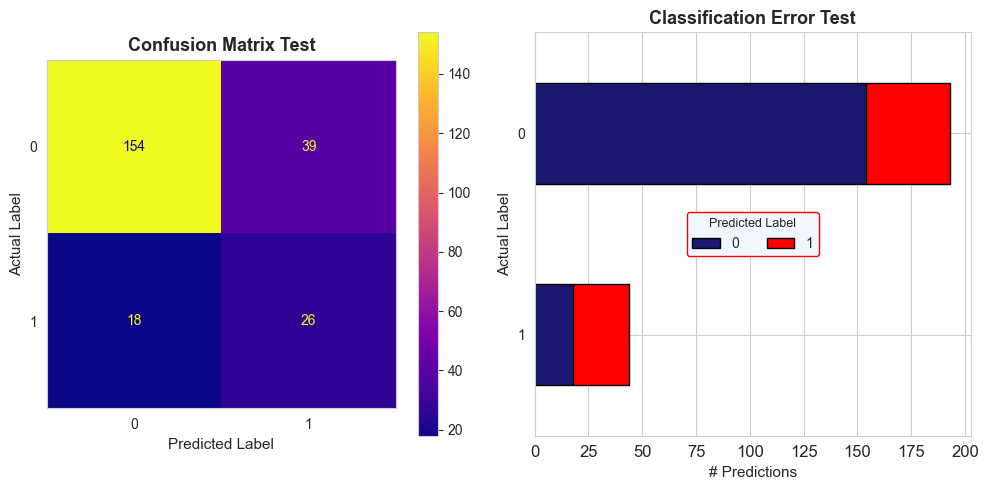

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 193 (81.0%)
- Class 1: 44 (19.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.895349,0.797927,0.843836,193.000000
1,0.400000,0.590909,0.477064,44.000000
accuracy,0.759494,0.759494,0.759494,0.759494
macro avg,0.647674,0.694418,0.660450,237.000000
weighted avg,0.803385,0.759494,0.775743,237.000000


In [49]:
classification_evaluation_report(
    model       = model,
    X           = X_test_drug,
    y           = y_test_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

- Feature Importance:

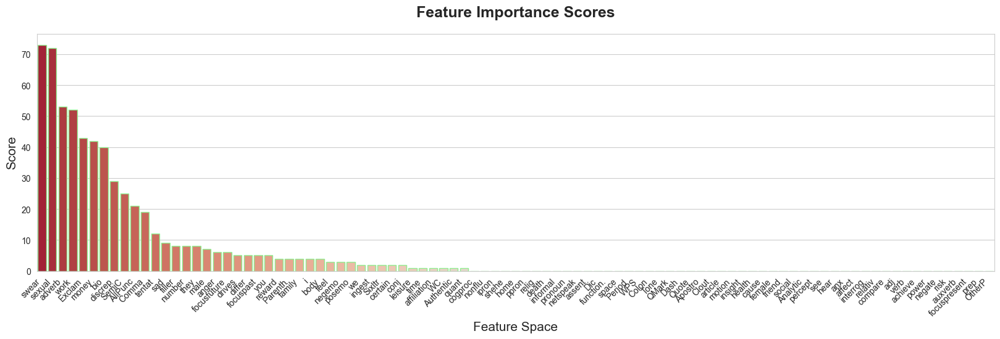

In [53]:
feature_importance_plot(
    model          = model,
    feature_names  = liwc,
    figsize         = (20, 5),
    horizontal     = True
)

- Select subset of features:

In [54]:
# threshold for feature importance
threshold = float(input("Enter the threshold for feature importance: ")) # 10

# select features with importance above threshold
selected_tree_features = [f for f, s in zip(liwc, model.feature_importances_) if s >= threshold]
print(f"Threshold: {threshold}")
print(f"# features selected: {len(selected_tree_features)}")
print(f"Selected features: {selected_tree_features}")

Threshold: 10.0
# features selected: 12
Selected features: ['adverb', 'discrep', 'tentat', 'bio', 'sexual', 'work', 'money', 'swear', 'AllPunc', 'Comma', 'SemiC', 'Exclam']


#### 5.2.1) Subset of features:

- Optimize:

In [55]:
def objective(trial):

    # LightGBM model
    model = lgb.LGBMClassifier(
                    num_leaves        = trial.suggest_int("num_leaves", 3, 30),
                    max_depth         = trial.suggest_int("max_depth", 2, 3),
                    learning_rate     = trial.suggest_loguniform("learning_rate", 0.0001, 0.01),
                    n_estimators      = trial.suggest_int("n_estimators", 100, 300),
                    min_child_samples = trial.suggest_int("min_child_samples", 100, 200),
                    subsample         = trial.suggest_uniform("subsample", 0.1, 0.5),
                    colsample_bytree  = trial.suggest_uniform("colsample_bytree", 0.1, 0.5),
                    reg_alpha         = trial.suggest_loguniform("reg_alpha", 1e-8, 10.0),
                    reg_lambda        = trial.suggest_loguniform("reg_lambda", 1e-8, 10.0),
                    objective         = 'binary',
                    metric            = 'binary_logloss',
                    scale_pos_weight  = weight_drugs,
                    boosting_type     = 'gbdt',
                    force_col_wise    = True,
                    verbose           = -1,
                    random_state      = 42
    )

    # Balanced accuracy scorer for cross-validation
    bal_acc_scorer = make_scorer(balanced_accuracy_score)

    # Initialize StratifiedKFold
    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Cross-validation with balanced accuracy score
    score = cross_val_score(
                        estimator = model,
                        X         = X_train_drug[selected_tree_features],
                        y         = y_train_drug,
                        n_jobs    = -1,
                        cv        = stratified_cv,
                        scoring   = bal_acc_scorer
    ).mean()

    return score

# Create Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-30 11:15:34,436] A new study created in memory with name: no-name-bee1f83f-2d41-4624-97a8-826d8fbb3909
[I 2023-12-30 11:15:38,871] Trial 0 finished with value: 0.5 and parameters: {'num_leaves': 13, 'max_depth': 2, 'learning_rate': 0.00024324244232840973, 'n_estimators': 279, 'min_child_samples': 124, 'subsample': 0.48733653117061637, 'colsample_bytree': 0.10034901299943236, 'reg_alpha': 4.205672744432382e-07, 'reg_lambda': 5.3819499540575274e-05}. Best is trial 0 with value: 0.5.
[I 2023-12-30 11:15:39,238] Trial 1 finished with value: 0.5 and parameters: {'num_leaves': 14, 'max_depth': 2, 'learning_rate': 0.00010287840853419324, 'n_estimators': 296, 'min_child_samples': 191, 'subsample': 0.46869747122159877, 'colsample_bytree': 0.2748466549571156, 'reg_alpha': 0.00036032997283257193, 'reg_lambda': 1.4900878400669825e-05}. Best is trial 0 with value: 0.5.
[I 2023-12-30 11:15:39,530] Trial 2 finished with value: 0.5 and parameters: {'num_leaves': 16, 'max_depth': 3, 'learnin

___________________________________________________________________________________________________
Best trial: {'num_leaves': 3, 'max_depth': 2, 'learning_rate': 0.009431105459319309, 'n_estimators': 223, 'min_child_samples': 146, 'subsample': 0.10882776164700823, 'colsample_bytree': 0.493492268352381, 'reg_alpha': 1.1765920465035478e-08, 'reg_lambda': 5.603403163668851}


- Refit:

In [58]:
best_params = study.best_trial.params

model = lgb.LGBMClassifier(
                    num_leaves        = best_params['num_leaves'],
                    max_depth         = best_params['max_depth'],
                    learning_rate     = best_params['learning_rate'],
                    n_estimators      = best_params['n_estimators'],
                    min_child_samples = best_params['min_child_samples'],
                    subsample         = best_params['subsample'],
                    colsample_bytree  = best_params['colsample_bytree'],
                    reg_alpha         = best_params['reg_alpha'],
                    reg_lambda        = best_params['reg_lambda'],
                    objective         = 'binary',
                    metric            = 'binary_logloss',
                    boosting_type     = 'gbdt',
                    scale_pos_weight  = weight_drugs,
                    force_col_wise    = True,
                    verbose           = -1,
                    random_state      = 42
)

model.fit(
    X_train_drug[selected_tree_features],
    y_train_drug
)

LGBMClassifier(colsample_bytree=0.493492268352381, force_col_wise=True,
               learning_rate=0.009431105459319309, max_depth=2,
               metric='binary_logloss', min_child_samples=146, n_estimators=223,
               num_leaves=3, objective='binary', random_state=42,
               reg_alpha=1.1765920465035478e-08, reg_lambda=5.603403163668851,
               scale_pos_weight=4.42, subsample=0.10882776164700823,
               verbose=-1)

- Evaluate:

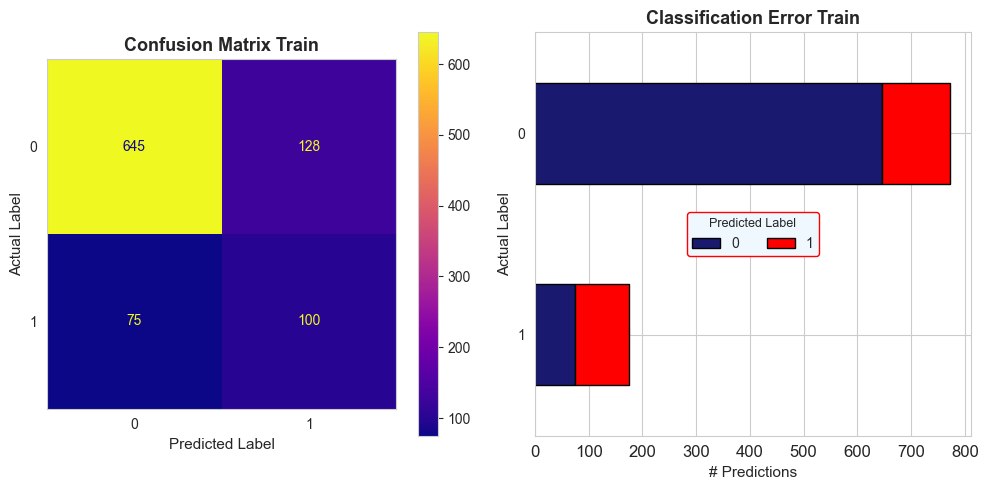

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 773 (82.0%)
- Class 1: 175 (18.0%)

Classification Report Train:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.895833,0.834411,0.864032,773.000000
1,0.438596,0.571429,0.496278,175.000000
accuracy,0.785865,0.785865,0.785865,0.785865
macro avg,0.667215,0.702920,0.680155,948.000000
weighted avg,0.811428,0.785865,0.796145,948.000000


In [59]:
classification_evaluation_report(
    model       = model,
    X           = X_train_drug[selected_tree_features],
    y           = y_train_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Train'
)

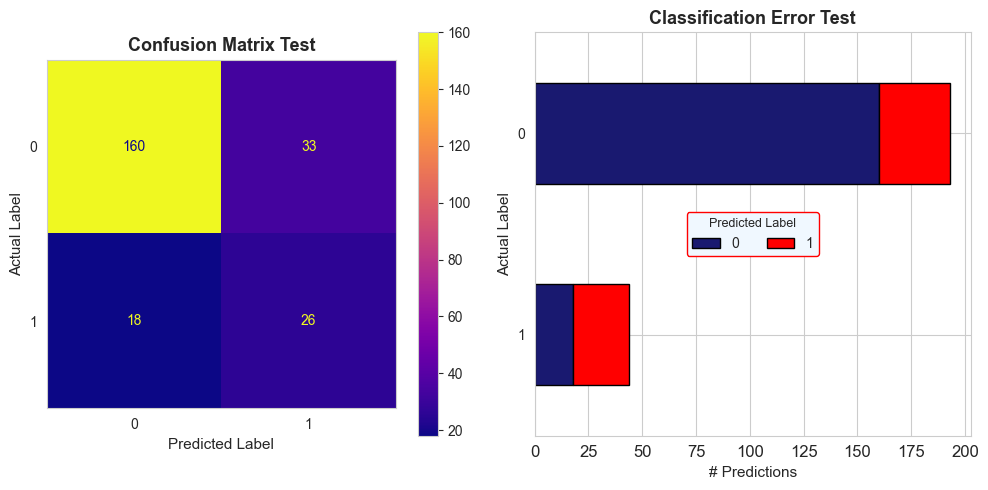

Class Distribution in Dataset:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
- Class 0: 193 (81.0%)
- Class 1: 44 (19.0%)

Classification Report Test:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


,precision,recall,f1-score,support
0,0.898876,0.829016,0.862534,193.000000
1,0.440678,0.590909,0.504854,44.000000
accuracy,0.784810,0.784810,0.784810,0.784810
macro avg,0.669777,0.709962,0.683694,237.000000
weighted avg,0.813810,0.784810,0.796129,237.000000


In [60]:
classification_evaluation_report(
    model       = model,
    X           = X_test_drug[selected_tree_features],
    y           = y_test_drug,
    threshold   = 0.5,
    figsize      = (10, 5),
    title_suffix = 'Test'
)

### 5.3) Random Forest

#### 5.3.1) All Features:

In [62]:
from sklearn.utils.class_weight import compute_sample_weight

# Assuming binary classification and y_train is your target variable
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train_drug)
sample_weights

array([0.61319534, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       2.70857143, 0.61319534, 0.61319534, 0.61319534, 2.70857143,
       0.61319534, 0.61319534, 2.70857143, 2.70857143, 0.61319534,
       2.70857143, 0.61319534, 0.61319534, 0.61319534, 2.70857143,
       0.61319534, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       2.70857143, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       0.61319534, 0.61319534, 0.61319534, 0.61319534, 2.70857143,
       0.61319534, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       0.61319534, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       0.61319534, 0.61319534, 2.70857143, 0.61319534, 0.61319534,
       0.61319534, 2.70857143, 2.70857143, 0.61319534, 0.61319534,
       0.61319534, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       2.70857143, 0.61319534, 0.61319534, 0.61319534, 0.61319534,
       0.61319534, 0.61319534, 0.61319534, 0.61319534, 2.70857143,
       0.61319534, 2.70857143, 0.61319534, 0.61319534, 0.61319

In [63]:
from sklearn.ensemble import RandomForestClassifier

def objective(trial):
    # Random Forest model hyperparameters
    model = RandomForestClassifier(
        n_estimators=trial.suggest_int("n_estimators", 50, 300),
        max_depth=trial.suggest_int("max_depth", 2, 30),
        min_samples_split=trial.suggest_int("min_samples_split", 2, 20),
        min_samples_leaf=trial.suggest_int("min_samples_leaf", 1, 20),
        max_features=trial.suggest_categorical("max_features", ['auto', 'sqrt', 'log2']),
        bootstrap=trial.suggest_categorical("bootstrap", [True, False]),
        random_state=42
    )

    stratified_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    scores = []

    for train_idx, test_idx in stratified_cv.split(X_train_drug, y_train_drug):
        X_train_fold, X_test_fold = X_train_drug[train_idx], X_train_drug[test_idx]
        y_train_fold, y_test_fold = y_train_drug[train_idx], y_train_drug[test_idx]
        sample_weight_fold = sample_weights[train_idx]

        model.fit(X_train_fold, y_train_fold, sample_weight=sample_weight_fold)
        predictions = model.predict(X_test_fold)
        score = balanced_accuracy_score(y_test_fold, predictions)
        scores.append(score)

    return np.mean(scores)

# Create Optuna Study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=33, timeout=4000)

# Output best trial
print(99*'_')
print('Best trial:', study.best_trial.params)

[I 2023-12-30 11:26:15,639] A new study created in memory with name: no-name-86797426-614a-42e9-b14d-6eff18ef9a69
[W 2023-12-30 11:26:15,657] Trial 0 failed with parameters: {'n_estimators': 239, 'max_depth': 2, 'min_samples_split': 8, 'min_samples_leaf': 14, 'max_features': 'log2', 'bootstrap': False} because of the following error: KeyError("None of [Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,\n       ...\n       936, 937, 938, 940, 942, 943, 944, 945, 946, 947],\n      dtype='int64', length=853)] are in the [columns]").
Traceback (most recent call last):
  File "/Users/sebastianwefers/Desktop/SEMESTER5/Domainspecific_Case_Studies_Tools/newenv39/lib/python3.9/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "/var/folders/20/y44pt9c51ts69c9fjlbm2glh0000gn/T/ipykernel_811/3658756648.py", line 19, in objective
    X_train_fold, X_test_fold = X_train_drug[train_idx], X_train_drug[test_idx]
  File "/Users/sebastianwefe

KeyError: "None of [Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,\n       ...\n       936, 937, 938, 940, 942, 943, 944, 945, 946, 947],\n      dtype='int64', length=853)] are in the [columns]"